In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import scipy as sp
import statistics as sts
import os
import glob
import statsmodels.stats.multitest as multi
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec
import matplotlib.pyplot as plt

plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['pdf.fonttype'] = 42

%matplotlib inline

In [2]:
#directories
artdeco_dir = 'C:/Users/Admin/Documents/ARTDecoData/'
results_dir = 'C:/Users/Admin/Documents/RESULTS/'

In [3]:
#dictionary with everything for each tissue, starting with folder name
TissuesDict = {'ADPSUB': ['adipose_subcutaneous'], 
               'ADPVIS': ['adipose_visceral'],
               'ARTAOR': ['artery_aorta'],
               'ARTCOR': ['artery_coronary'],
               'ARTTIB': ['artery_tibial'],
               'BRNCER': ['brain_cerebellum'],
               'BRNCTX': [ 'brain_cortex'],
               'BREAST': ['breast_mammary_tissue'],
               'COLON':  ['colon_sigmoid'],
               'ESOGAST': ['esophagus_gastroesophageal_junction'],
               'ESOMUC': ['esophagus_mucosa'],
               'ESOMUS': ['esophagus_muscularis'],
               'HEARTAP': ['heart_atrial_appendage'],
               'HEARTLV': ['heart_left_ventricle'],
               'LIVER': ['liver'],
               'LUNG': ['lung'],
               'MUSSKL': ['muscle_skeletal'],
               'NERVE': ['nerve_tibial'],               
               'PITTY': ['pituitary'],
               'SKINLL': ['skin_sun_exposed'],
               'SKINSP': ['skin_not_sun_exposed'],
               'TESTIS': ['testis'],
               'THYRD': ['thyroid']}

In [4]:
#dictionary with colors for each tissue for plots
PaletteDict = {'ADPSUB': '#FFE14A',
               'ADPVIS': '#E3C942',
               'ARTAOR': '#FF6666',
               'ARTCOR': '#FF7777',
               'ARTTIB': '#FF8888',
               'BRNCER': '#76A2E3',
               'BRNCTX': '#6E97D4',
               'BREAST': '#E4B5ED',
               'COLON': '#B56D37',
               'ESOGAST': '#FF9A4D', 
               'ESOMUC': '#E68B45',
               'ESOMUS': '#C7783C', 
               'HEARTAP': '#AB3434',
               'HEARTLV': '#BF3A3A', 
               'LIVER': '#75825B',
               'LUNG': '#74C296', 
               'MUSSKL': '#FF9159',
               'NERVE': '#6084BA',
               'PITTY': '#5575A3', 
               'SKINLL': '#E1FF4A',
               'SKINSP': '#D6FF4F',
               'TESTIS': '#7DD43B', 
               'THYRD': '#876FAB'}

In [5]:
#upload dataframe with gene types
GeneTypes = pd.read_table(artdeco_dir + 'gene_attributes_human.gencode.v37.annotation.tidy.tab', sep = ',')
GeneTypes['Gene ID'] = GeneTypes['geneID']
GeneTypes.index = GeneTypes['geneID']
GeneTypes = GeneTypes.drop('geneID', axis = 1)

In [6]:
#upload dataframe with all genes and their locations
CondensedGenes = pd.read_table(artdeco_dir + 'genes_condensed.bed',
                               names = ['Chromosome', 'Start', 'End', 'ID', 'Score', 'Strand'])
CondensedGenes.index = CondensedGenes['ID']

.

.

.

# FIND EXPRESSED GENES

In [7]:
def GetExpressedGenes(artdeco_dir, tissue_folder, fpkm_thres = 1):
    """FUNCTION GIVES DATAFRAME OF GENES FROM A CERTAIN TISSUE WITH EXPRESSION
    HIGHER THAN FPKM_THRES AND ITS EXPRESSION IN EACH SAMPLE"""

    #import tables with transcript expression and max isoforms
    transcripts_fpkm = pd.read_table(artdeco_dir + tissue_folder + '/quantification/gene.exp.fpkm.txt').drop('Length', axis = 1)
    max_isoforms = pd.read_table(artdeco_dir + tissue_folder + '/quantification/max_isoform.txt')

    #create a new list with only the max isoform transcripts and their expression
    transcripts_fpkm = transcripts_fpkm.rename(columns = {'ID': 'Transcript ID'})
    gene_isoforms = transcripts_fpkm.merge(max_isoforms, on = 'Transcript ID', how = 'inner')

    #re-organise columns list to show GeneID, Transcript ID, and every other column after
    gene_isoforms = gene_isoforms[['Gene ID','Transcript ID', *gene_isoforms.columns[1:-1]]]
    
    #filter by fpkm = fpkm_thres and drop remaining unless they are present in at least 25% of samples
    gene_isoforms_filtered = gene_isoforms.iloc[:,2:][gene_isoforms.iloc[:,2:] >= fpkm_thres]
    gene_isoforms_filtered = gene_isoforms_filtered.dropna(thresh = int(len(gene_isoforms_filtered.columns)/4))
    
    return gene_isoforms.iloc[gene_isoforms_filtered.index.tolist(), :]

In [8]:
#create dataframe with genes and their expression for each tissue and then add to dictionary
for tissue in TissuesDict:
    AllEG = GetExpressedGenes(artdeco_dir, TissuesDict[tissue][0])
    TissuesDict[tissue].append(AllEG)

In [9]:
def SaveGenesList(IDcolumn, folder, tissuefilename, directory = results_dir, divider = ','):
    """SAVES .TXT FILE WITH LIST OF GENES"""
    
    #delete .X to save the ID for the gene and not a specific transcript
    save = IDcolumn.str.split('.').str[0]
    
    #create pathway if it doesn'r exist
    pathway = directory + folder
    if os.path.exists(pathway) is False:
        os.makedirs(pathway)
    else:
        pass
    
    #save list of genes
    save.to_csv(pathway + tissuefilename, sep = divider, index = False, header = False)
    
    return print(tissuefilename + ' saved in ' + folder.split('/')[0] + '!')

In [10]:
#save list of expressed genes for each tissue
for tissue in TissuesDict:
    AllEG = TissuesDict[tissue][1]
    SaveGenesList(AllEG['Gene ID'], 'AllEGLists/', tissue + 'ExpGeneList.txt')

ADPSUBExpGeneList.txt saved in AllEGLists!
ADPVISExpGeneList.txt saved in AllEGLists!
ARTAORExpGeneList.txt saved in AllEGLists!
ARTCORExpGeneList.txt saved in AllEGLists!
ARTTIBExpGeneList.txt saved in AllEGLists!
BRNCERExpGeneList.txt saved in AllEGLists!
BRNCTXExpGeneList.txt saved in AllEGLists!
BREASTExpGeneList.txt saved in AllEGLists!
COLONExpGeneList.txt saved in AllEGLists!
ESOGASTExpGeneList.txt saved in AllEGLists!
ESOMUCExpGeneList.txt saved in AllEGLists!
ESOMUSExpGeneList.txt saved in AllEGLists!
HEARTAPExpGeneList.txt saved in AllEGLists!
HEARTLVExpGeneList.txt saved in AllEGLists!
LIVERExpGeneList.txt saved in AllEGLists!
LUNGExpGeneList.txt saved in AllEGLists!
MUSSKLExpGeneList.txt saved in AllEGLists!
NERVEExpGeneList.txt saved in AllEGLists!
PITTYExpGeneList.txt saved in AllEGLists!
SKINLLExpGeneList.txt saved in AllEGLists!
SKINSPExpGeneList.txt saved in AllEGLists!
TESTISExpGeneList.txt saved in AllEGLists!
THYRDExpGeneList.txt saved in AllEGLists!


.

.

.

# FIND GENES WITH RT TRANSCRIPTS

In [11]:
#filter list given by ARTDeco to delete ambiguous TR transcripts that result from lack of strandedness using run-bedtools-intersect.sh

In [12]:
def GetTRT(artdeco_dir, tissue_folder, tissueEG, fpkm_thres = 0.15):
    """FUNCTION GIVES DATAFRAME WITH TRT TRANSCRIPTS AND THEIR EXPRESSION"""
    
    #create final tissue dataframes
    TRT = pd.DataFrame([], columns = ['ID'])
    Length = pd.DataFrame([], columns = ['ID'])
    
    for file in list(glob.glob(artdeco_dir + tissue_folder + '/dogs-filtered-antisense-genes/*out.dogs.fpkm.txt')):
        #import table of filtered RT transcripts for each sample
        sample_transcripts = pd.read_table(file)
        
        #keep transcripts only for expressed genes
        sample_transcripts = sample_transcripts[sample_transcripts['ID'].isin(tissueEG['Gene ID'])]
        
        #keep only those with a minimum coverage level (> fpkm_thres)
        sample_transcripts = sample_transcripts[sample_transcripts.iloc[:, 2] >= fpkm_thres]
        
        #add to final tissue dataframes
        sample_TRT = sample_transcripts.drop('Length', axis = 1).reset_index(drop = True)
        TRT = TRT.merge(sample_TRT, 'outer', 'ID')
        
        sample_Length = sample_transcripts[['ID', 'Length']].reset_index(drop = True)
        sample_Length[sample_transcripts.columns[-1]] = sample_Length['Length']
        sample_Length = sample_Length.drop('Length', axis = 1)
        Length = Length.merge(sample_Length, 'outer', 'ID')
    
    #keep only max length for each transcript
    Length.index = Length['ID']
    Length = Length.max(numeric_only = True, axis = 1, skipna = True).dropna()
    Length = pd.DataFrame([Length]).T.rename(columns = {0: 'Length'})
    Length['ID'] = Length.index
    Length = Length[['ID','Length']]
    
    
    return TRT, Length

In [13]:
#create dataframes with RT transcripts and their expression/length for each tissue and then add to the dictionary
for tissue in TissuesDict:
    folder = TissuesDict[tissue][0]
    AllEG = TissuesDict[tissue][1]
    
    TRT, Length = GetTRT(artdeco_dir, folder, AllEG)
    TissuesDict[tissue].append(TRT)
    TissuesDict[tissue].append(Length)

In [14]:
#save list of expressed RT transcripts for each tissue
for tissue in TissuesDict:
    TRT = TissuesDict[tissue][2]
    SaveGenesList(TRT['ID'], 'TRTLists/', tissue + 'ExpTRTList.txt')

ADPSUBExpTRTList.txt saved in TRTLists!
ADPVISExpTRTList.txt saved in TRTLists!
ARTAORExpTRTList.txt saved in TRTLists!
ARTCORExpTRTList.txt saved in TRTLists!
ARTTIBExpTRTList.txt saved in TRTLists!
BRNCERExpTRTList.txt saved in TRTLists!
BRNCTXExpTRTList.txt saved in TRTLists!
BREASTExpTRTList.txt saved in TRTLists!
COLONExpTRTList.txt saved in TRTLists!
ESOGASTExpTRTList.txt saved in TRTLists!
ESOMUCExpTRTList.txt saved in TRTLists!
ESOMUSExpTRTList.txt saved in TRTLists!
HEARTAPExpTRTList.txt saved in TRTLists!
HEARTLVExpTRTList.txt saved in TRTLists!
LIVERExpTRTList.txt saved in TRTLists!
LUNGExpTRTList.txt saved in TRTLists!
MUSSKLExpTRTList.txt saved in TRTLists!
NERVEExpTRTList.txt saved in TRTLists!
PITTYExpTRTList.txt saved in TRTLists!
SKINLLExpTRTList.txt saved in TRTLists!
SKINSPExpTRTList.txt saved in TRTLists!
TESTISExpTRTList.txt saved in TRTLists!
THYRDExpTRTList.txt saved in TRTLists!


.

.

.

# FIND AMBIGUOUS GENES 

In [15]:
def GetAmbiguous(artdeco_dir, tissue_folder, tissueEG, tissueTRT):
    """FUNCTION GIVES DATAFRAME OF AMBIGUOUS GENES FROM A CERTAIN TISSUE THAT ARTDECO QUANTIFIES AS PRODUCING RT TRANSCRIPTS"""
   
    #create dataframe
    TRT = pd.DataFrame([], columns = ['ID'])
    
    #import table of all RT transcripts found by ARTDeco
    sample_transcripts = pd.read_table(artdeco_dir + tissue_folder + '/dogs/all_dogs.fpkm.txt')
        
    #keep transcripts only for expressed genes
    sample_transcripts = sample_transcripts[sample_transcripts['ID'].isin(tissueEG['Gene ID'])]
        
    #keep only those not in TRT dataframe
    sample_transcripts = sample_transcripts[~sample_transcripts['ID'].isin(tissueTRT['ID'])]
        
    #add to final tissue dataframe
    sample_TRT = sample_transcripts.drop('Length', axis = 1).reset_index(drop = True)
    TRT = TRT.merge(sample_TRT, 'outer', 'ID')
    
    return TRT

In [16]:
#create dataframe with ambiguous genes for every tissue and add to dictionary
for tissue in TissuesDict:
    folder = TissuesDict[tissue][0]
    AllEG = TissuesDict[tissue][1]
    TRT = TissuesDict[tissue][2]
    
    AMB = GetAmbiguous(artdeco_dir, folder, AllEG, TRT)
    TissuesDict[tissue].append(AMB)

In [17]:
#save list of ambiguous genes for each tissue
for tissue in TissuesDict:
    AMB = TissuesDict[tissue][4]
    SaveGenesList(AMB['ID'], 'AmbiguousLists/', tissue + 'AmbList.txt')

ADPSUBAmbList.txt saved in AmbiguousLists!
ADPVISAmbList.txt saved in AmbiguousLists!
ARTAORAmbList.txt saved in AmbiguousLists!
ARTCORAmbList.txt saved in AmbiguousLists!
ARTTIBAmbList.txt saved in AmbiguousLists!
BRNCERAmbList.txt saved in AmbiguousLists!
BRNCTXAmbList.txt saved in AmbiguousLists!
BREASTAmbList.txt saved in AmbiguousLists!
COLONAmbList.txt saved in AmbiguousLists!
ESOGASTAmbList.txt saved in AmbiguousLists!
ESOMUCAmbList.txt saved in AmbiguousLists!
ESOMUSAmbList.txt saved in AmbiguousLists!
HEARTAPAmbList.txt saved in AmbiguousLists!
HEARTLVAmbList.txt saved in AmbiguousLists!
LIVERAmbList.txt saved in AmbiguousLists!
LUNGAmbList.txt saved in AmbiguousLists!
MUSSKLAmbList.txt saved in AmbiguousLists!
NERVEAmbList.txt saved in AmbiguousLists!
PITTYAmbList.txt saved in AmbiguousLists!
SKINLLAmbList.txt saved in AmbiguousLists!
SKINSPAmbList.txt saved in AmbiguousLists!
TESTISAmbList.txt saved in AmbiguousLists!
THYRDAmbList.txt saved in AmbiguousLists!


.

.

.

# MAKE DATAFRAME OF EXPRESSED GENES EXCLUDING AMBIGUOUS

In [18]:
def GetExpNAGenes(tissueAllEG, tissueAMB):
    """FUNCTION RETURNS EXPRESSED GENES DATAFRAME WITHOUT AMBIGUOUS GENES"""
    
    #keep only expressed genes that are not in the ambiguous genes dataframe
    EG = tissueAllEG[~tissueAllEG['Gene ID'].isin(tissueAMB['ID'])]
    
    return EG

In [19]:
#create dataframe of expressed without ambiguous genes for every tissue and add to dictionary
for tissue in TissuesDict:
    folder = TissuesDict[tissue][0]
    AllEG = TissuesDict[tissue][1]
    TRT = TissuesDict[tissue][2]
    AMB = TissuesDict[tissue][4]
    
    EG = GetExpNAGenes(AllEG, AMB)
    TissuesDict[tissue].append(EG)

In [20]:
#save list of expressed genes for each tissue
for tissue in TissuesDict:
    EG = TissuesDict[tissue][5]
    SaveGenesList(EG['Gene ID'], 'EGLists/', tissue + 'ExpList.txt')

ADPSUBExpList.txt saved in EGLists!
ADPVISExpList.txt saved in EGLists!
ARTAORExpList.txt saved in EGLists!
ARTCORExpList.txt saved in EGLists!
ARTTIBExpList.txt saved in EGLists!
BRNCERExpList.txt saved in EGLists!
BRNCTXExpList.txt saved in EGLists!
BREASTExpList.txt saved in EGLists!
COLONExpList.txt saved in EGLists!
ESOGASTExpList.txt saved in EGLists!
ESOMUCExpList.txt saved in EGLists!
ESOMUSExpList.txt saved in EGLists!
HEARTAPExpList.txt saved in EGLists!
HEARTLVExpList.txt saved in EGLists!
LIVERExpList.txt saved in EGLists!
LUNGExpList.txt saved in EGLists!
MUSSKLExpList.txt saved in EGLists!
NERVEExpList.txt saved in EGLists!
PITTYExpList.txt saved in EGLists!
SKINLLExpList.txt saved in EGLists!
SKINSPExpList.txt saved in EGLists!
TESTISExpList.txt saved in EGLists!
THYRDExpList.txt saved in EGLists!


.

.

.

# SAMPLES PER TISSUE

In [21]:
def GetSamplesPerTissue(dictionary):
    """CREATE DATAFRAME WITH NUMBER OF SAMPLES PER TISSUE"""
    
    res = pd.DataFrame()
    
    for tissue in dictionary:                
        EG = dictionary[tissue][5]
        
        #delete ID columns so we have only the sample columns, then count them and add the value to the dataframe
        samples = EG.drop(columns = ['Gene ID']).drop(columns = ['Transcript ID'])
        val = len(samples.columns)
        additional = pd.DataFrame([[val, tissue]], columns = ['Number of samples', 'Tissue'])
        res = pd.concat([res, additional])
    
    return res

In [22]:
#create dataframe with number of samples per tissue
tissuesamples = GetSamplesPerTissue(TissuesDict)

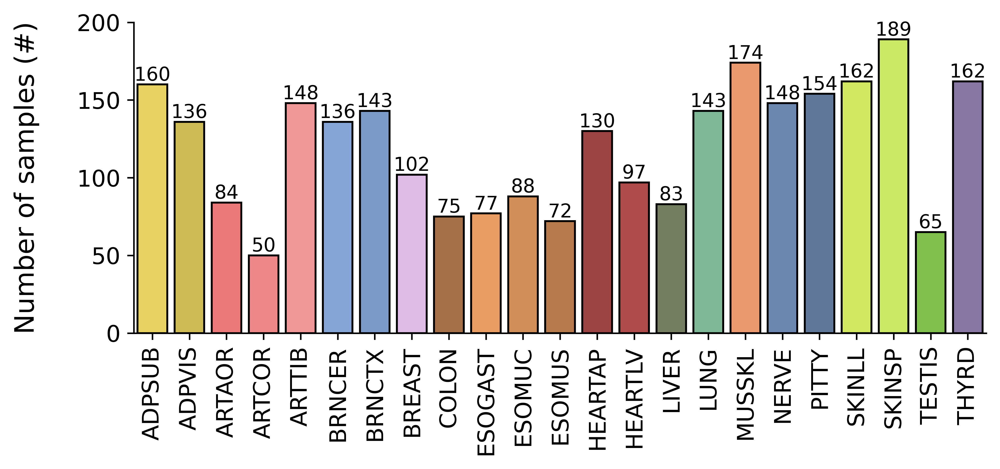

In [23]:
#create barplot with number of samples per tissue

#define plot size
fig, ax = plt.subplots(figsize = (8, 3), dpi = 600)

#create barplot using color palette defined before
sns.barplot(data = tissuesamples, x = 'Tissue', y = 'Number of samples',
            edgecolor = 'black', linewidth = 1, palette = PaletteDict,  dodge = False)

#define plot labels and axis ticks
plt.ylabel('''Number of samples (#)
''', fontsize = 14)
plt.xlabel('')
plt.xticks(rotation = 90, fontsize = 12, ha = 'center')
plt.yticks(rotation = 0, fontsize = 12, ha = 'right')
ax.set_yticks(np.asarray([0, 50, 100, 150, 200]))

#take out boundary lines except for x and y
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

#add number of samples on top of bars
ax.bar_label(ax.containers[0])

#define y limits
plt.ylim([0, 200])

plt.savefig(results_dir + 'plots/samplespertissue.pdf')

In [24]:
#number of total samples
tissuesamples.sum()

Number of samples                                                 2778
Tissue               ADPSUBADPVISARTAORARTCORARTTIBBRNCERBRNCTXBREA...
dtype: object

.

.

.

# GENES PER TISSUE

In [25]:
def GetNumbers(dictionary, dict_df, ID_column):
    """CREATE DATAFRAME OF GENES/TRANSCRIPTS PER TISSUE"""
    
    res = pd.DataFrame()
    
    for tissue in dictionary:
        tissue_df = dictionary[tissue][dict_df]

        #doing .shape[0] of a dataframe's column gives the number of rows, which in this case is the number of genes
        number = pd.DataFrame([tissue_df[ID_column].shape[0]], index = [tissue], columns = ['Number'])
        res = pd.concat([number, res])
    
    return res

In [26]:
#create dataframes with number of RT transcripts and expressed genes including and excluding ambiguous
AllEGnumber = GetNumbers(TissuesDict, 1, 'Gene ID')
EGnumber = GetNumbers(TissuesDict, 5, 'Gene ID')
RTnumber = GetNumbers(TissuesDict, 2, 'ID')
AMBnumber = GetNumbers(TissuesDict, 4, 'ID')

C:\Users\Admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_index will be keyword-only
  
C:\Users\Admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_index will be keyword-only
  import sys
C:\Users\Admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_index will be keyword-only
  if __name__ == '__main__':


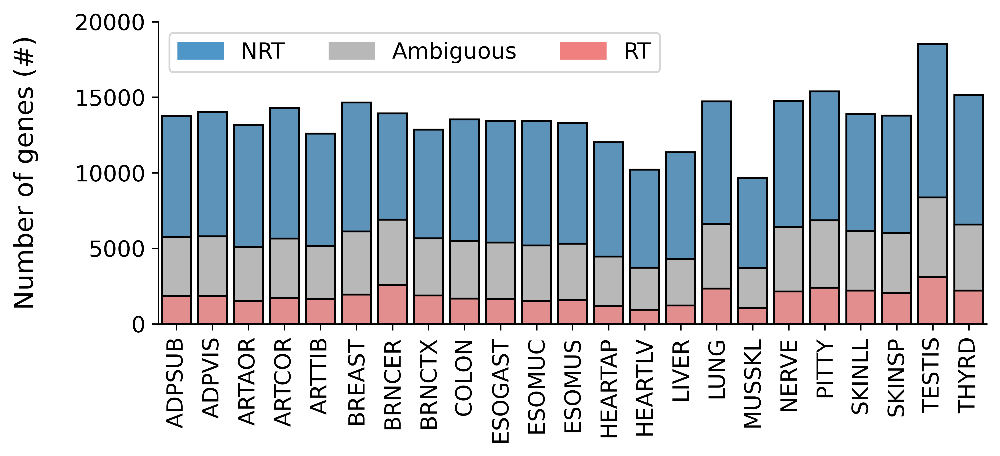

In [27]:
#create stacked barplot that shows NRT genes, RT genes and ambiguous genes
fig, ax = plt.subplots(figsize = (8, 3), dpi = 600)

#create multiple bars to show up on top of each other, not stacked
#have to use AllEG instead of EG otherwise proportion wouldn't be right
bar1 = sns.barplot(data = AllEGnumber.sort_index(0, 'ascending').T, color = '#4F96C8', edgecolor = 'black', linewidth = 1)
bar2 = sns.barplot(data = AMBnumber.sort_index(0, 'ascending').T + RTnumber.sort_index(0, 'ascending').T, estimator = sum, ci = None,  color = '#B8B8B8',
                  edgecolor = 'black', linewidth = 1)
bar3 = sns.barplot(data = RTnumber.sort_index(0, 'ascending').T, estimator = sum, ci = None,  color = '#F08080',
                  edgecolor = 'black', linewidth = 1)

#add labels
top_bar = mpatches.Patch(color = '#4F96C8', label = 'NRT')
middle_bar = mpatches.Patch(color = '#B8B8B8', label = 'Ambiguous')
bottom_bar = mpatches.Patch(color = '#F08080', label = 'RT')
plt.legend(handles = [top_bar, middle_bar, bottom_bar], fontsize = 12, loc = 'upper left', ncol = 3)

plt.ylabel('''Number of genes (#)
''', fontsize = 14)
plt.xlabel('')
plt.xticks(rotation = 90, fontsize = 12, ha = 'center')
plt.yticks(rotation = 0, fontsize = 12, ha = 'right')
ax.set_yticks(np.asarray([0, 5000, 10000, 15000, 20000]))

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.ylim([0, 20000])

plt.savefig(results_dir + 'plots/allgenes.pdf')

In [28]:
#average percentage of ambiguous genes
(AMBnumber/AllEGnumber).mean()

Number    0.283024
dtype: float64

In [29]:
#average percentage of RT genes
(RTnumber/EGnumber).mean()

Number    0.185564
dtype: float64

In [30]:
#average percentage of RT genes
(RTnumber/EGnumber)

,Number
THYRD,0.204786
TESTIS,0.233185
SKINSP,0.206400
SKINLL,0.221965
PITTY,0.219470
NERVE,0.205079
MUSSKL,0.151000
LUNG,0.223073
LIVER,0.147638
HEARTLV,0.125674


.

.

.

# RT TRANSCRIPTS PER TISSUE

In [31]:
#make summary dataframe with number of genes, transcripts, and the percentages of genes with transcripts for every tissue
SummaryTable = pd.DataFrame()

for tissue in TissuesDict:
    folder = TissuesDict[tissue][0]
    EG = TissuesDict[tissue][5]
    TRT = TissuesDict[tissue][2]
    AMB = TissuesDict[tissue][4]
    
    additional  = pd.DataFrame([[tissue, len(EG), len(TRT), round(len(TRT)/len(EG)*100, 2)]])
    SummaryTable = pd.concat([SummaryTable, additional])
    
SummaryTable.columns = ['Tissue', 'ExpGenes', 'TRT', 'TRT %']
SummaryTable.index = SummaryTable['Tissue']

In [32]:
#create dataframe with number of RT transcripts per sample
TRTalltissues = pd.DataFrame()

for tissue in TissuesDict:
    TRT = TissuesDict[tissue][2]
    
    additional = TRT.count().to_frame()
    additional.columns = [tissue]
    TRTalltissues = pd.concat([TRTalltissues, additional], axis = 1)
    
TRTalltissues = TRTalltissues.drop('ID')

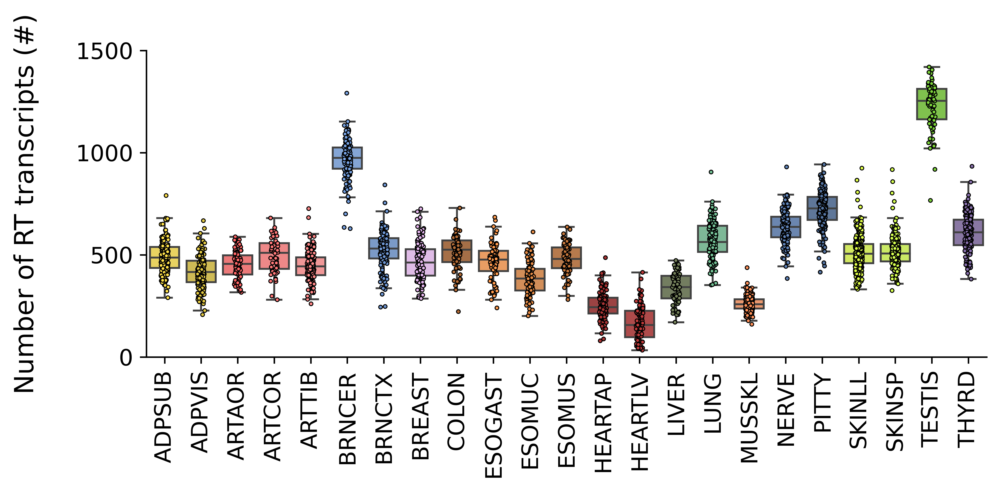

In [33]:
#create boxplot with number of RT transcripts per sample per tissue
fig, ax = plt.subplots(figsize = (8, 3), dpi = 600)

sns.boxplot(data = TRTalltissues, linewidth = 1, palette = PaletteDict, fliersize = 0)
sns.stripplot(data = TRTalltissues, size = 2, linewidth = 0.5, edgecolor = 'black', palette = PaletteDict)

plt.ylabel('''Number of RT transcripts (#)
''', fontsize = 14)
plt.xlabel('')
plt.xticks(rotation = 90, fontsize = 12, ha = 'center')
plt.yticks(rotation = 0, fontsize = 12, ha = 'right')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_yticks(np.asarray([0, 500, 1000, 1500]))

plt.ylim([0, 1500])

plt.savefig(results_dir + 'plots/rtsamples.pdf')

.

.

.

# GENE EXPRESSION

In [34]:
FPKMbyTRT = pd.DataFrame()

for tissue in TissuesDict:
    EG = TissuesDict[tissue][5]
    TRT = TissuesDict[tissue][2]
    Length = TissuesDict[tissue][3]

    NoTRT = EG[~EG['Gene ID'].isin(TRT['ID'])]
    YesTRT = EG[EG['Gene ID'].isin(TRT['ID'])]
    
    #average FPKM for each gene
    NoTRTExp = NoTRT.mean(axis = 1, numeric_only = True)
    YesTRTExp = YesTRT.mean(axis = 1, numeric_only = True)
    
    #create dataframe with tissue, average FPKM, whether it produces RT transcripts (and length if so) for each gene
    NoTRTres = pd.concat([NoTRT['Gene ID'], NoTRTExp], axis = 1).reset_index(drop = True)
    NoTRTres = pd.concat([pd.DataFrame([len(NoTRTres)*[tissue]]).T, NoTRTres], axis = 1)
    NoTRTres = pd.concat([NoTRTres, pd.DataFrame([len(NoTRTres)*['NRT']]).T], axis = 1)
    NoTRTres = pd.concat([NoTRTres, pd.DataFrame([len(NoTRTres)*[0]]).T], axis = 1)
    NoTRTres = pd.concat([NoTRTres, pd.DataFrame([len(NoTRTres)*[0]]).T], axis = 1)
    NoTRTres.index = NoTRTres['Gene ID']
    NoTRTres.columns = ['Tissues', 'Gene ID', 'Average FPKM', 'TRT', 'TRT FPKM', 'Length']
    
    YesTRTres = pd.concat([YesTRT['Gene ID'], YesTRTExp], axis = 1).reset_index(drop = True)
    YesTRTres = pd.concat([pd.DataFrame([len(YesTRTres)*[tissue]]).T, YesTRTres], axis = 1)
    YesTRTres = pd.concat([YesTRTres, pd.DataFrame([len(YesTRTres)*['RT']]).T], axis = 1)
    YesTRTres.index = YesTRTres['Gene ID']
    TRT.index = TRT['ID']
    YesTRTres = pd.concat([YesTRTres, TRT.T[1:].mean().to_frame()], axis = 1)
    YesTRTres = pd.concat([YesTRTres, Length[Length['ID'].isin(YesTRT['Gene ID'])]['Length']], axis = 1)
    YesTRTres.columns = ['Tissues', 'Gene ID', 'Average FPKM', 'TRT', 'TRT FPKM', 'Length']
    
    tissueres = pd.concat([NoTRTres, YesTRTres], axis = 0)
    FPKMbyTRT = pd.concat([FPKMbyTRT, tissueres])

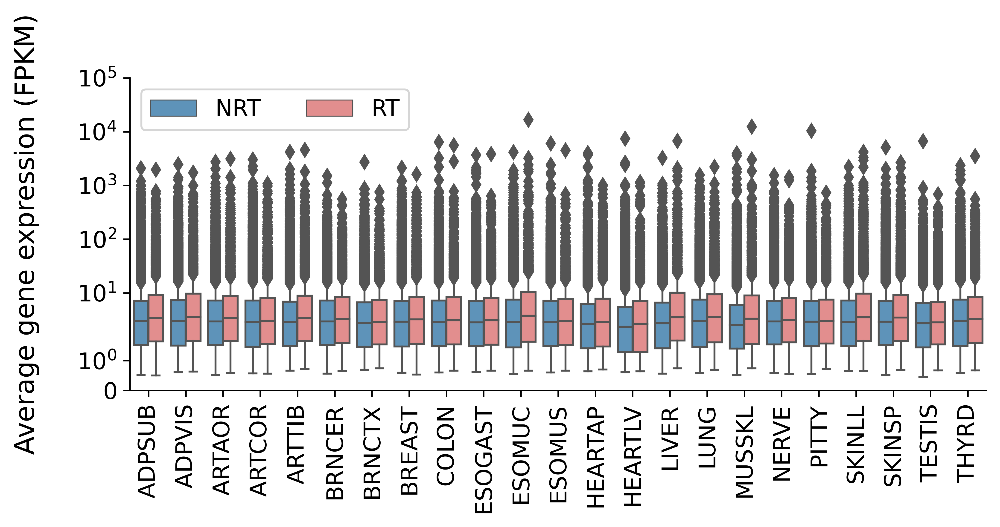

In [35]:
#create boxplot for distribuition of FPKM of genes for each tissue
fig, ax = plt.subplots(figsize = (8, 3), dpi = 600)

sns.boxplot(data = FPKMbyTRT, x = 'Tissues', y = 'Average FPKM', 
            hue = 'TRT', palette = {'RT': '#F08080', 'NRT': '#4F96C8'}, linewidth = 1)

plt.legend(fontsize = 12, loc = 'upper left', ncol = 2)

plt.ylabel('''Average gene expression (FPKM)
''', fontsize = 14)
plt.xlabel('')
plt.xticks(rotation = 90, fontsize = 12, ha = 'center')
plt.yticks(rotation = 0, fontsize = 12, ha = 'right')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.ylim([0, 100000])

#log scale
plt.yscale('symlog')

plt.savefig(results_dir + 'plots/averagefpkm.pdf')

In [36]:
def MWU(expgroup1, expgroup2):
    
    res = sp.stats.mannwhitneyu(expgroup1, expgroup2, use_continuity = True, alternative = 'two-sided')
    
    return res

In [37]:
def FDR(dataframe):
    """FUNCTION ADDS 2 COLUMNS WITH FDR VALUES AND WHETHER OR NOT THEY'RE SITGNIFICANT TO A DATAFRAME WITH P-VALUES"""
    
    dataframe['FDR'] = multi.fdrcorrection(dataframe['p-value'], alpha = 0.05, method = 'i', is_sorted = False)[1]

    significance = []

    for fdr in dataframe['FDR']:
            if fdr < 0.05:
                significance.append('p < 0.05 (Significant)')

            else: 
                significance.append('p > 0.05 (Not Significant)')

    dataframe['FDR Significance'] = significance
    
    return dataframe

In [38]:
#creates dataframe that says whether or not NRT and RT expression levels in a given tissue are significantly different
TRTMWU = pd.DataFrame([])

for tissue in TissuesDict:
    expgroup1 = FPKMbyTRT[(FPKMbyTRT['Tissues'] == tissue) & (FPKMbyTRT['TRT'] == 'NRT')]['Average FPKM']
    expgroup2 = FPKMbyTRT[(FPKMbyTRT['Tissues'] == tissue) & (FPKMbyTRT['TRT'] == 'RT')]['Average FPKM']

    stats, pval = MWU(expgroup1, expgroup2) 
    additional = pd.DataFrame([[tissue, stats, pval]], columns = ['Tissue', 'Stat', 'p-value'])
    
    TRTMWU = pd.concat([TRTMWU, additional])

TRTMWU = FDR(TRTMWU)

In [39]:
TRTMWU[TRTMWU['FDR Significance'] == 'p > 0.05 (Not Significant)']

,Tissue,Stat,p-value,FDR,FDR Significance
0,ESOMUS,6148930.0,0.173248,0.173248,p > 0.05 (Not Significant)
0,PITTY,10007656.0,0.075018,0.078428,p > 0.05 (Not Significant)


In [40]:
def CorrelationPlot(dataframe, xcolumn, ycolumn, xlabeltext, ylabeltext, fig, xlims, ylims, legendloc = 'upper right', save = 'no'):
    """GIVES SCATTER PLOT FOR CORRELATION"""
    
    legendtext = 'r = ' + str(round(sp.stats.pearsonr(dataframe[xcolumn], dataframe[ycolumn])[0], 3)) + '''
    p = ''' + str(round(sp.stats.pearsonr(dataframe[xcolumn], dataframe[ycolumn])[1], 3))
    
    plt.subplots(figsize = fig, dpi = 600)
    
    sns.scatterplot(x = dataframe[xcolumn], y = dataframe[ycolumn], label = legendtext)
    plt.legend(fontsize = 16)
    
    plt.xlabel(xlabeltext, fontsize = 14)
    plt.ylabel(ylabeltext, fontsize = 14)
    
    plt.xticks(rotation = 0, fontsize = 12, ha = 'center')
    plt.yticks(rotation = 0, fontsize = 12, ha = 'right')
    
    plt.legend(fontsize = 12, loc = legendloc)
    
    plt.xlim(xlims)
    plt.ylim(ylims)
    
    if save is not 'no':
        plt.savefig(results_dir + save)
    else:
        pass
    
    return plt.show()

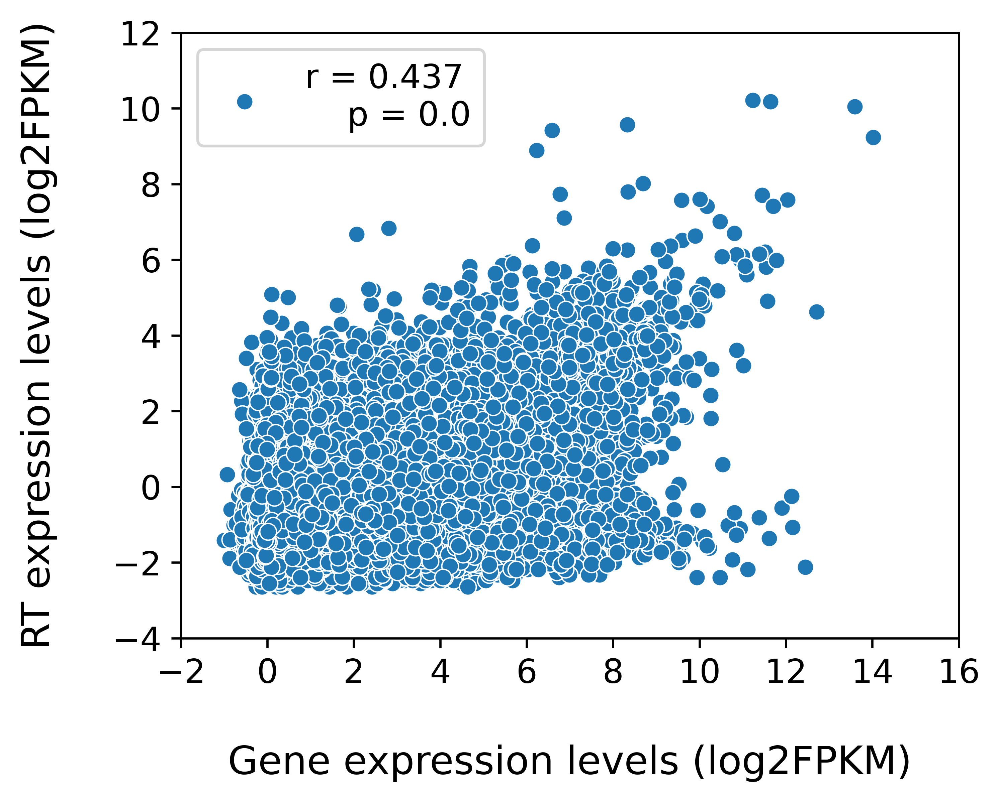

In [41]:
#correlation between gene and RT expression
xlabeltext = '''
Gene expression levels (log2FPKM)'''

ylabeltext = '''RT expression levels (log2FPKM)
                    '''

log2FPKM = np.log2(FPKMbyTRT[FPKMbyTRT['TRT'] == 'RT'][['Average FPKM','TRT FPKM']])

CorrelationPlot(log2FPKM, 'Average FPKM', 'TRT FPKM', xlabeltext, ylabeltext, (5, 4), [-2, 16], [-4, 12],
                'upper left' , 'plots/correlationexpressions.pdf')

.

.

.

# GENES AND RT TRANSCRIPTS IN COMMON

In [42]:
def GiveCommonGenes(dictionary):
    """GIVE FOUR LISTS: ALL GENES EXPRESSED, GENES IN COMMON BETWEEN TISSUES,
    ALL TRT TRANSCRIPTS AND TRT TRANSCRIPTS IN COMMON BETWEEN TISSUES"""
    
    totalgenes = pd.DataFrame()
    totalTRT = pd.DataFrame()
    
    #lists of all genes and RT transcripts expressed in all tissues
    for tissue in dictionary:
        EG = dictionary[tissue][5]
        totalgenes = pd.concat([totalgenes, EG['Gene ID']])
        
        TRT = dictionary[tissue][2]
        totalTRT = pd.concat([totalTRT, TRT['ID']])
        
    #eliminate repeats 
    totalgenes = totalgenes[0].unique()
    totalTRT = totalTRT[0].unique()
    
    #lists of genes and RT transcripts expressed in common in all tissues
    commongenes = totalgenes
    commonTRT = totalTRT
    
    #for each tissue, keep from the list only the genes/RT transcripts that are in that tissue
    for tissue in dictionary:
        EG = dictionary[tissue][5]
        EG = set(EG['Gene ID'])
        commongenes = EG.intersection(commongenes)
        
        TRT = dictionary[tissue][2]
        TRT = set(TRT['ID'])
        commonTRT = TRT.intersection(commonTRT)
        
    return pd.DataFrame(totalgenes), pd.DataFrame(commongenes, dtype = str), pd.DataFrame(totalTRT, dtype = str), pd.DataFrame(commonTRT, dtype = str)

In [43]:
#create and save lists of expressed genes and TRT transcripts
totalgenes, totalcommongenes, totalTRT, TRTcommongenes = GiveCommonGenes(TissuesDict)

SaveGenesList(totalgenes[0], 'total_and_common_lists/', 'all_genes_expressed.txt')
SaveGenesList(totalcommongenes[0], 'total_and_common_lists/', 'genes_expressed_in_common.txt')
SaveGenesList(totalTRT[0], 'total_and_common_lists/', 'all_TRTs_expressed.txt')
SaveGenesList(TRTcommongenes[0], 'total_and_common_lists/', 'TRTs_expressed_in_common.txt')

all_genes_expressed.txt saved in total_and_common_lists!
genes_expressed_in_common.txt saved in total_and_common_lists!
all_TRTs_expressed.txt saved in total_and_common_lists!
TRTs_expressed_in_common.txt saved in total_and_common_lists!


In [44]:
#dataframe with number of tissues each gene is expressed in
totalcountsgenes = []
for gene in set(totalgenes[0]):
    count = 0
    
    for tissue in TissuesDict:
        EG = TissuesDict[tissue][5]
        EG = set(EG['Gene ID'])
        
        if gene in EG:
            count = count + 1

    totalcountsgenes.append(count)

In [45]:
#dataframe with number of tissues each RT transcript is expressed in
totalcountsRT = []
for gene in set(totalTRT[0]):
    count = 0

    for tissue in TissuesDict:
        RT = TissuesDict[tissue][2]
        RT = set(RT['ID'])
        
        if gene in RT:
            count = count + 1

    totalcountsRT.append(count)

In [46]:
#dataframe showing the amount of tissues that transcripts are expressed in
InCommon = pd.DataFrame([['1', totalcountsRT.count(1)], ['2', totalcountsRT.count(2)],
             ['3', totalcountsRT.count(3)], ['4', totalcountsRT.count(4)],
             ['5', totalcountsRT.count(5)], ['6', totalcountsRT.count(6)],
             ['7', totalcountsRT.count(7)], ['8', totalcountsRT.count(8)],
             ['9', totalcountsRT.count(9)], ['10', totalcountsRT.count(10)],
             ['11', totalcountsRT.count(11)], ['12', totalcountsRT.count(12)],
             ['13', totalcountsRT.count(13)], ['14', totalcountsRT.count(14)],
             ['15', totalcountsRT.count(15)], ['16', totalcountsRT.count(16)],
             ['17', totalcountsRT.count(17)], ['18', totalcountsRT.count(18)],
             ['19', totalcountsRT.count(19)], ['20', totalcountsRT.count(20)],
             ['21', totalcountsRT.count(21)], ['22', totalcountsRT.count(22)],
             ['23', totalcountsRT.count(23)]], columns = ['Number of Tissues', 'Number of RT transcripts'])

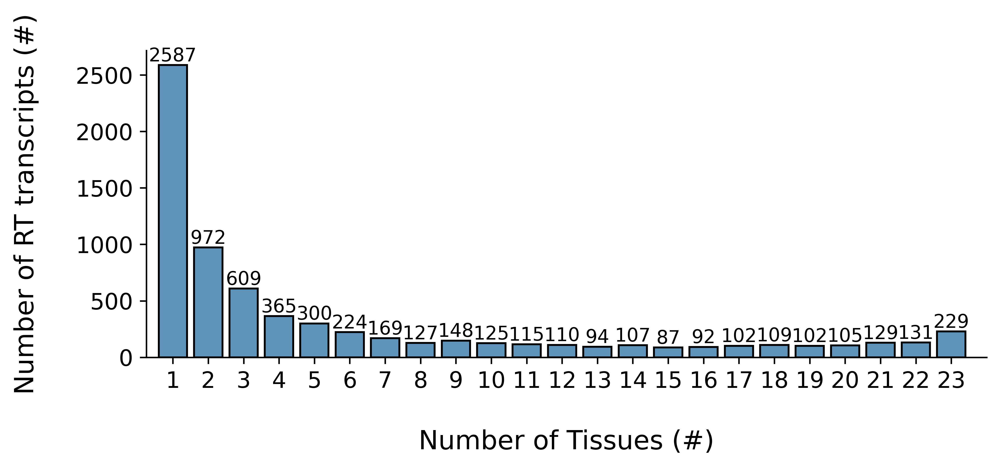

In [47]:
#create barplot with number of RT genes in common
fig, ax = plt.subplots(figsize = (8, 3), dpi = 600)

sns.barplot(data = InCommon, x = 'Number of Tissues', y = 'Number of RT transcripts',
            edgecolor = 'black', linewidth = 1, color = '#4F96C8')

plt.xlabel('''
Number of Tissues (#)''', fontsize = 14)
plt.ylabel('''Number of RT transcripts (#)
''', fontsize = 14)
plt.xticks(rotation = 0, fontsize = 12, ha = 'center')
plt.yticks(rotation = 0, fontsize = 12, ha = 'right')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.bar_label(ax.containers[0])
plt.xlim([-0.75,23])

plt.savefig(results_dir + 'plots/incommon.pdf')

.

.

.

# RT GENES CLASSIFICATION

In [48]:
def GiveGeneTypes(datatype, dictionary, GeneTypes, readindict = 0, closestdf = 0):
    """GIVES DATAFRAME WITH GENE TYPES PERCENTAGES"""
    resoppdf = pd.DataFrame()
    oppdf = pd.DataFrame()
    opp_dict = {}

    #define gene set
    for tissue in dictionary:
        if datatype == 'RT':
            oppgenes = dictionary[tissue][2]['ID']
        elif datatype == 'Genome':
            oppgenes = dictionary[tissue][5]['Gene ID']
        elif datatype == 'Read-in':
            if tissue in readindict:
                readin = readindict[tissue].astype({'TRT ID': str})
                EG = dictionary[tissue][5].copy()
                oppgenes = EG[EG['Gene ID'].isin(readin['TRT ID'])]['Gene ID']     
        elif datatype == 'Closest':
            EG = dictionary[tissue][5].copy()
            oppgenes = EG[EG['Gene ID'].isin(closestdf['ID Closest Gene'])]['Gene ID']
        else:
            print(datatype + ': type not defined error!')
            pass
        
        #keep only expressed genes
        oppstrandtypes = GeneTypes[GeneTypes['Gene ID'].isin(oppgenes)]
        opp_dict[tissue] = oppstrandtypes 
        oppstrandcounts = oppstrandtypes.groupby(by = 'geneType').count()
        oppstrandcounts = oppstrandcounts.sort_values('Gene ID')

        #count gene types
        proteins = 0
        lncRNAs = 0
        TECs = 0
        pseudogenes = 0
        TRs = 0
        IGs = 0
        RNAs = 0
        Ribozymes = 0

        for genetype in oppstrandcounts.index:
            if 'protein_coding' in genetype:
                proteins = proteins + oppstrandcounts[oppstrandcounts.index == genetype]['Gene ID'][0]

            elif 'lncRNA' in genetype:
                lncRNAs = lncRNAs + oppstrandcounts[oppstrandcounts.index == genetype]['Gene ID'][0]

            elif 'TEC' in genetype:
                TECs = TECs + oppstrandcounts[oppstrandcounts.index == genetype]['Gene ID'][0]

            elif 'pseudogene' in genetype:
                pseudogenes = pseudogenes + oppstrandcounts[oppstrandcounts.index == genetype]['Gene ID'][0]

            elif 'TR_' in genetype:
                TRs = TRs + oppstrandcounts[oppstrandcounts.index == genetype]['Gene ID'][0]

            elif 'IG_' in genetype:
                IGs = IGs + oppstrandcounts[oppstrandcounts.index == genetype]['Gene ID'][0]

            elif 'RNA' in genetype:
                RNAs = RNAs + oppstrandcounts[oppstrandcounts.index == genetype]['Gene ID'][0]

            elif 'ribozyme' in genetype:
                Ribozymes = Ribozymes + oppstrandcounts[oppstrandcounts.index == genetype]['Gene ID'][0]
                
            else:
                print(genetype + ': type not found error!')

            total = proteins + lncRNAs + TECs + pseudogenes + TRs + IGs + RNAs + Ribozymes

            protein = pd.DataFrame([proteins/total], index = [tissue], columns = ['Protein-coding'])
            lncRNA = pd.DataFrame([lncRNAs/total], index = [tissue], columns = ['lncRNA'])
            TEC = pd.DataFrame([TECs/total], index = [tissue], columns = ['TEC'])
            pseudogene = pd.DataFrame([pseudogenes/total], index = [tissue], columns = ['Pseudogenes']) 
            TR = pd.DataFrame([TRs/total], index = [tissue], columns = ['TRs']) 
            IG = pd.DataFrame([IGs/total], index = [tissue], columns = ['IGs']) 
            RNA = pd.DataFrame([RNAs/total], index = [tissue], columns = ['Small RNAs'])
            ribozyme = pd.DataFrame([Ribozymes/total], index = [tissue], columns = ['Ribozymes'])

            oppdf = pd.concat([protein, lncRNA, pseudogene, RNA, ribozyme, TEC, TR, IG], axis = 1)
        
        resoppdf = pd.concat([resoppdf, oppdf], axis = 0)
    
    return resoppdf

In [49]:
types_genome = GiveGeneTypes('Genome', TissuesDict, GeneTypes)
types_genome.mean()

Protein-coding    0.730490
lncRNA            0.139837
Pseudogenes       0.055437
Small RNAs        0.060732
Ribozymes         0.000140
TEC               0.008734
TRs               0.000847
IGs               0.003783
dtype: float64

In [50]:
types_genome['Others (Ribozymes, TEC, TRs, IGs)'] = types_genome['Ribozymes'] + types_genome['TEC'] + types_genome['TRs'] + types_genome['IGs']
types_genome = types_genome[['Protein-coding', 'lncRNA', 'Pseudogenes', 'Small RNAs', 'Others (Ribozymes, TEC, TRs, IGs)']]

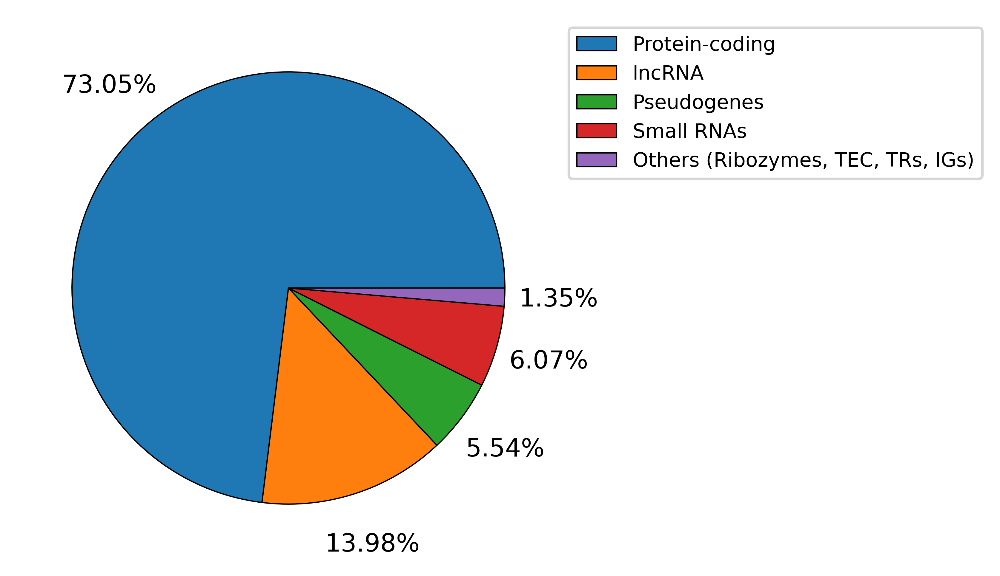

In [51]:
#make pie plot for gene types in expressed genes
fig, ax = plt.subplots(figsize = (4, 4), dpi = 600)

plt.pie(types_genome.mean(), labels = types_genome.mean().index, autopct = '%1.2f%%', pctdistance = 1.25,
        labeldistance = None, wedgeprops = {'linewidth': 0.5, 'edgecolor': 'black'})

plt.legend(fontsize = 8, bbox_to_anchor = (1, 1), loc = 'upper left')

plt.savefig(results_dir + 'plots/genometype.pdf')

In [52]:
types_rt = GiveGeneTypes('RT', TissuesDict, GeneTypes)
types_rt.mean()

Protein-coding    0.851233
lncRNA            0.095546
Pseudogenes       0.041845
Small RNAs        0.003454
Ribozymes         0.000000
TEC               0.005696
TRs               0.000594
IGs               0.001633
dtype: float64

In [53]:
types_rt['Others (Ribozymes, TEC, TRs, IGs)'] = types_rt['Ribozymes'] + types_rt['TEC'] + types_rt['TRs'] + types_rt['IGs']
types_rt = types_rt[['Protein-coding', 'lncRNA', 'Pseudogenes', 'Small RNAs', 'Others (Ribozymes, TEC, TRs, IGs)']]

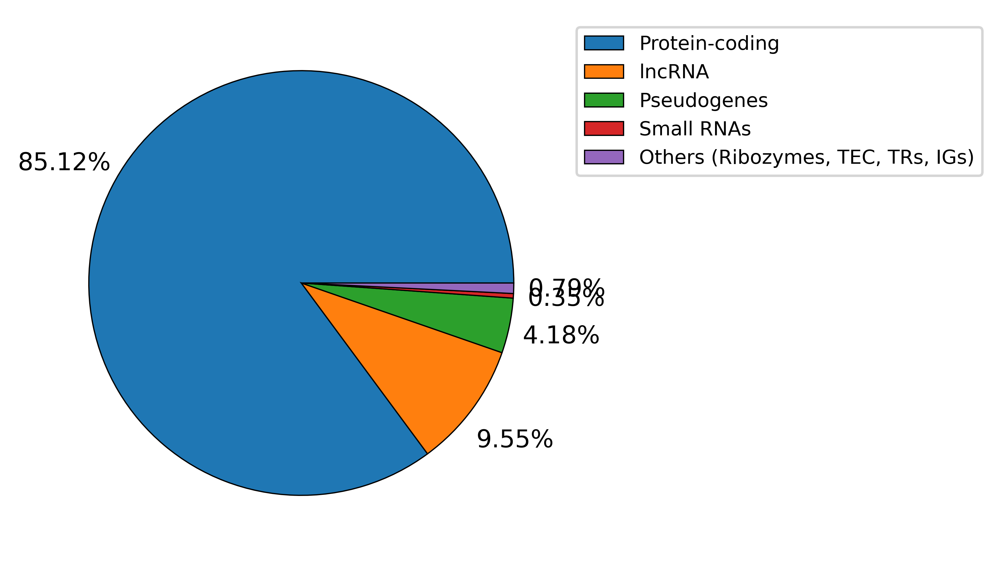

In [54]:
#make pie plot for gene types in RT genes
fig, ax = plt.subplots(figsize = (4, 4), dpi = 600)

plt.pie(types_rt.mean(), labels = types_rt.mean().index, autopct = '%1.2f%%', pctdistance = 1.25,
        labeldistance = None, wedgeprops = {'linewidth': 0.5, 'edgecolor': 'black'})

plt.legend(fontsize = 8, bbox_to_anchor = (1, 1), loc = 'upper left')

plt.savefig(results_dir + 'plots/rttype.pdf')

In [55]:
def FisherTest(dictionary, GeneTypes):
    """PERFORMS FISHER TEST BETWEEN TRT AND NOT TRT, DIVIDED BY GENE TYPE"""
    
    res = pd.DataFrame()
    
    for tissue in dictionary:
        EG = dictionary[tissue][5]
        EG.index = EG['Gene ID']
        
        TRT = dictionary[tissue][2]
        TRT.index = TRT['ID']
        
        genetypedf = GeneTypes
        trt_genetype = []
        notrt_genetype = []
        trt_notgenetype = []
        notrt_notgenetype = []
        
        for gene in EG.index:
            if gene in TRT.index and gene in genetypedf.index:
                trt_genetype.append(gene)

            elif gene in TRT.index and gene not in genetypedf.index:
                trt_notgenetype.append(gene)

            elif gene not in TRT.index and gene not in genetypedf.index:
                notrt_notgenetype.append(gene)

            else:
                notrt_genetype.append(gene)
            
        df = pd.DataFrame([[len(trt_genetype), len(trt_notgenetype)], [len(notrt_genetype), len(notrt_notgenetype)]],
                  columns = ['Gene Type', 'Not Gene Type'], index = ['RT', 'NRT'])
            
        oddsratio, fisherp = sp.stats.fisher_exact(df, alternative = 'two-sided')
        
        if fisherp < 0.05:
            additional = pd.DataFrame([[tissue, fisherp, 'p < 0.05 (Significant)']])
        
        else: 
            additional = pd.DataFrame([[tissue, fisherp, 'p > 0.05 (Not Significant)']])
        
        res = pd.concat([res, additional])

    res.columns = ['Tissue', 'p', 'Significance']
        
    res['FDR'] = multi.fdrcorrection(res['p'], alpha = 0.05, method = 'i', is_sorted = False)[1]
    significance = []
    
    print(df)

    for fdr in res['FDR']:
        if fdr < 0.05:
            significance.append('p < 0.05 (Significant)')

        else: 
            significance.append('p > 0.05 (Not Significant)')

    res['FDR Significance'] = significance

    return res

In [56]:
proteincoding = FisherTest(TissuesDict, GeneTypes[GeneTypes['geneType'] == 'protein_coding'])
proteincoding[proteincoding['FDR Significance'] == 'p > 0.05 (Not Significant)']

     Gene Type  Not Gene Type
RT        1825            383
NRT       5728           2846


,Tissue,p,Significance,FDR,FDR Significance


.

.

.

# READ-IN GENES

In [57]:
#create .bed files with only expressed genes and TRT transcripts for each tissue and then save
for tissue in TissuesDict:
    tissue_folder = TissuesDict[tissue][0]
    EG = TissuesDict[tissue][5]
    TRT = TissuesDict[tissue][2]
    
    EGbed = CondensedGenes[CondensedGenes['ID'].isin(EG['Gene ID'])]  
    #have to use different bedfile to have transcript start and end positions instead of gene
    TRTbed = pd.read_table(artdeco_dir + folder + '/dogs-filtered-antisense-genes/all_dogs.bed',
                           names = ['Chromosome', 'Start', 'End', 'ID', 'Score', 'Strand'])
    TRTbed = TRTbed[TRTbed['ID'].isin(TRT['ID'])]
    
    pathway = results_dir + 'bedfiles/' + tissue_folder
    if os.path.exists(pathway) is False:
        os.makedirs(pathway)
    else:
        pass

    EGbed.to_csv(pathway + '/Genes.bed', sep = '\t', index = False, header = False)
    TRTbed.to_csv(pathway + '/TRT.bed', sep = '\t', index = False, header = False)

#use these commands to run bedtools:
#cd /mnt/c/Users/Admin/Documents/RESULTS/bedfiles/
#for i in *; do >$i/sortedTRT.bed sort -k1,1V -k2,2n -i $i/TRT.bed; done
#for i in *; do >$i/sortedGenes.bed sort -k1,1V -k2,2n -i $i/Genes.bed; done
#for i in *; do >$i/read-in.txt bedtools intersect -a $i/sortedTRT.bed -b $i/sortedGenes.bed -wo -s; done

In [58]:
#count number of read-in genes
readincounts = pd.DataFrame([])

for tissue in TissuesDict:
    tissue_folder = TissuesDict[tissue][0]
    read_in = pd.read_table(results_dir + 'bedfiles/' + tissue_folder + '/read-in.txt',
                           names = ['Gene Chromosome', 'Gene Start', 'Gene End', 'Gene ID', 'Gene Delete', 'Gene Strand',
                                    'TRT Chromosome', 'TRT Start', 'TRT End', 'TRT ID', 'TRT Delete', 'TRT Strand',
                                    'Overlap']).drop(['Gene Delete', 'TRT Delete'], axis = 1)
    
    read_in = read_in[read_in['Overlap'] > 0]
    tissuecounts = read_in[['Gene ID', 'Overlap']].groupby(by = 'Gene ID').count().value_counts().to_frame().T
    tissuecounts['Tissue'] = [tissue]
    readincounts = pd.concat([readincounts, tissuecounts], axis = 0)
    
readincounts = readincounts.fillna(0)
readincounts = readincounts.convert_dtypes()
readincounts.columns = ['1', '2', 'Tissue']
readincounts['Total'] = readincounts['1'] + readincounts['2']
readincounts = readincounts.reset_index(drop = True)
readincounts = readincounts[['Tissue', '1', '2', 'Total']]
readincounts.index = readincounts['Tissue']

C:\Users\Admin\Anaconda3\lib\site-packages\pandas\core\indexes\multi.py:3559: RuntimeWarning: The values in the array are unorderable. Pass `sort=False` to suppress this warning.
  result = lib.fast_unique_multiple([self._values, rvals], sort=sort)


In [59]:
#calculate percentage of TRT events in which read-in happens
readincounts['Total']/SummaryTable['TRT'].sort_values()

Tissue
ADPSUB     0.017307
ADPVIS      0.01634
ARTAOR     0.021405
ARTCOR     0.026316
ARTTIB     0.016959
BREAST     0.019598
BRNCER     0.020305
BRNCTX     0.012273
COLON      0.023214
ESOGAST     0.02457
ESOMUC     0.022966
ESOMUS     0.023462
HEARTAP    0.017751
HEARTLV    0.012876
LIVER       0.02455
LUNG        0.01801
MUSSKL     0.016083
NERVE      0.021415
PITTY      0.021241
SKINLL     0.014033
SKINSP     0.014859
TESTIS     0.013303
THYRD      0.017663
dtype: Float64

In [60]:
#add read-in genes to dictionary
for tissue in TissuesDict:
    tissue_folder = TissuesDict[tissue][0]
    read_in = pd.read_table(results_dir + 'bedfiles/' + tissue_folder + '/read-in.txt',
                           names = ['Gene Chromosome', 'Gene Start', 'Gene End', 'Gene ID', 'Gene Delete', 'Gene Strand',
                                    'TRT Chromosome', 'TRT Start', 'TRT End', 'TRT ID', 'TRT Delete', 'TRT Strand',
                                    'Overlap']).drop(['Gene Delete', 'TRT Delete'], axis = 1)
    
    #make sure strand and chromosome columns are the same (as "quality control") before appending to dictionary
    if read_in['Gene Strand'].equals(read_in['TRT Strand']) is True:
        if read_in['Gene Chromosome'].equals(read_in['TRT Chromosome']) is True:
            print(tissue,'- Everything is okay!')
            TissuesDict[tissue].append(read_in)
        else:
            print(tissue,'- Chromosome Problem')
    else:
        print(tissue,'- Strand Problem')

ADPSUB - Everything is okay!
ADPVIS - Everything is okay!
ARTAOR - Everything is okay!
ARTCOR - Everything is okay!
ARTTIB - Everything is okay!
BRNCER - Everything is okay!
BRNCTX - Everything is okay!
BREAST - Everything is okay!
COLON - Everything is okay!
ESOGAST - Everything is okay!
ESOMUC - Everything is okay!
ESOMUS - Everything is okay!
HEARTAP - Everything is okay!
HEARTLV - Everything is okay!
LIVER - Everything is okay!
LUNG - Everything is okay!
MUSSKL - Everything is okay!
NERVE - Everything is okay!
PITTY - Everything is okay!
SKINLL - Everything is okay!
SKINSP - Everything is okay!
TESTIS - Everything is okay!
THYRD - Everything is okay!


In [61]:
#count number of read-in genes for each transcript where there is downstream overlap
readincounts = pd.DataFrame([])

for tissue in TissuesDict:
    read_in = TissuesDict[tissue][6]
    tissuecounts = read_in[['Gene ID', 'Overlap']].groupby(by = 'Gene ID').count().value_counts().to_frame().T
    tissuecounts['Tissue'] = [tissue]
    readincounts = pd.concat([readincounts, tissuecounts], axis = 0)

readincounts = readincounts.fillna(0)
readincounts = readincounts.convert_dtypes()
readincounts.columns = ['1', '2', 'Tissue']
readincounts['Total'] = readincounts['1'] + readincounts['2']
readincounts = readincounts.reset_index(drop = True)
readincounts = readincounts[['Tissue', '1', '2', 'Total']]

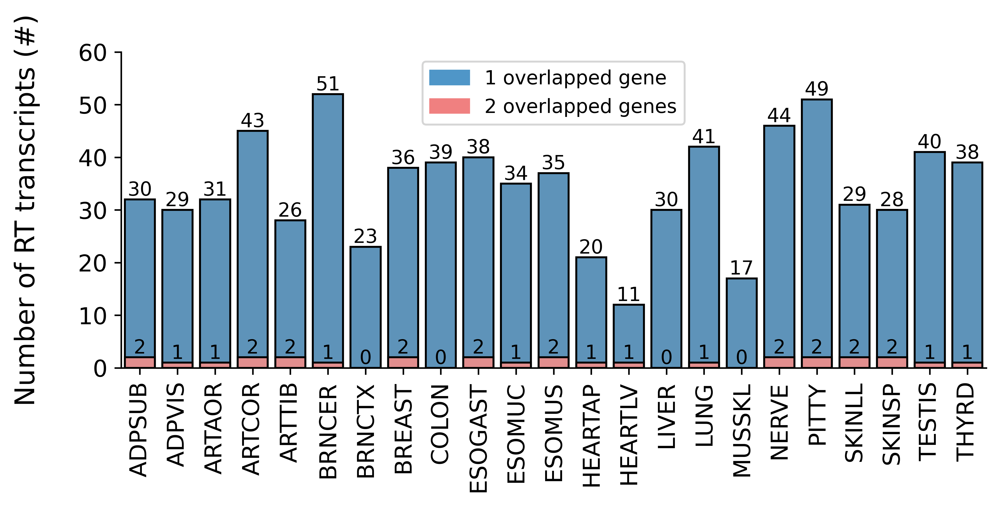

In [62]:
#create stacked barplot with number of overlapping genes per tissue
fig, ax = plt.subplots(figsize = (8, 3), dpi = 600)

bar1 = sns.barplot(data = readincounts, x = 'Tissue', y = 'Total', estimator = sum, ci = None,  color = '#4F96C8',
                  edgecolor = 'black', linewidth = 1)
bar2 = sns.barplot(data = readincounts, x = 'Tissue', y = '2', color = '#F08080', edgecolor = 'black', linewidth = 1)

#add labels
top_bar = mpatches.Patch(color = '#4F96C8', label = '1 overlapped gene')
bottom_bar = mpatches.Patch(color = '#F08080', label = '2 overlapped genes')
plt.legend(handles = [top_bar, bottom_bar])

plt.ylabel('''Number of RT transcripts (#)
''', fontsize = 14)
plt.xlabel('')
plt.xticks(rotation = 90, fontsize = 12, ha = 'center')
plt.yticks(rotation = 0, fontsize = 12, ha = 'right')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.bar_label(bar1.containers[0], labels = readincounts['1'])
ax.bar_label(bar2.containers[1])

plt.ylim([0, 60])

plt.savefig(results_dir + 'plots/read_in.pdf')

In [63]:
#dataframe with percentages of number of overlapped genes for read-in events
readinperc = readincounts.copy()
readinperc.index = readinperc['Tissue']
readinperc['1perc'] = readinperc['1']/readinperc['Total']
readinperc['2perc'] = readinperc['2']/readinperc['Total']
readinperc = readinperc.drop(['Tissue', '1', '2', 'Total'], axis = 1)
readinperc

,1perc,2perc
Tissue,,
ADPSUB,0.9375,0.0625
ADPVIS,0.966667,0.033333
ARTAOR,0.96875,0.03125
ARTCOR,0.955556,0.044444
ARTTIB,0.928571,0.071429
BRNCER,0.980769,0.019231
BRNCTX,1.0,0.0
BREAST,0.947368,0.052632
COLON,1.0,0.0


In [64]:
readindict = {}
for tissue in TissuesDict:
    readindict[tissue] = TissuesDict[tissue][6]['TRT ID'].to_frame()

In [65]:
#save list of expressed genes for each tissue
for tissue in readindict:
    readin = readindict[tissue]
    SaveGenesList(readin['TRT ID'], 'readinLists/', tissue + 'ReadinList.txt')

ADPSUBReadinList.txt saved in readinLists!
ADPVISReadinList.txt saved in readinLists!
ARTAORReadinList.txt saved in readinLists!
ARTCORReadinList.txt saved in readinLists!
ARTTIBReadinList.txt saved in readinLists!
BRNCERReadinList.txt saved in readinLists!
BRNCTXReadinList.txt saved in readinLists!
BREASTReadinList.txt saved in readinLists!
COLONReadinList.txt saved in readinLists!
ESOGASTReadinList.txt saved in readinLists!
ESOMUCReadinList.txt saved in readinLists!
ESOMUSReadinList.txt saved in readinLists!
HEARTAPReadinList.txt saved in readinLists!
HEARTLVReadinList.txt saved in readinLists!
LIVERReadinList.txt saved in readinLists!
LUNGReadinList.txt saved in readinLists!
MUSSKLReadinList.txt saved in readinLists!
NERVEReadinList.txt saved in readinLists!
PITTYReadinList.txt saved in readinLists!
SKINLLReadinList.txt saved in readinLists!
SKINSPReadinList.txt saved in readinLists!
TESTISReadinList.txt saved in readinLists!
THYRDReadinList.txt saved in readinLists!


In [66]:
types_readin = GiveGeneTypes('Read-in', TissuesDict, GeneTypes, readindict = readindict)
types_readin.mean()

Protein-coding    0.336815
lncRNA            0.538566
Pseudogenes       0.063709
Small RNAs        0.002867
Ribozymes         0.000000
TEC               0.051520
TRs               0.006524
IGs               0.000000
dtype: float64

In [67]:
types_readin['Others (Ribozymes, TEC, TRs, IGs)'] = types_readin['Ribozymes'] + types_readin['TEC'] + types_readin['TRs'] + types_readin['IGs']
types_readin = types_readin[['Protein-coding', 'lncRNA', 'Pseudogenes', 'Small RNAs', 'Others (Ribozymes, TEC, TRs, IGs)']]

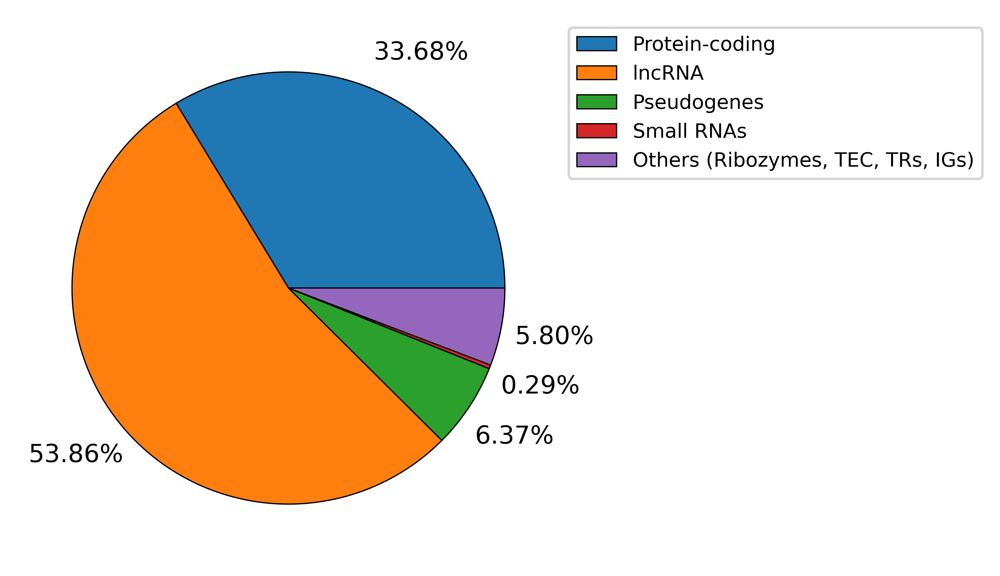

In [68]:
#make pie plot for gene types in read-in genes
fig, ax = plt.subplots(figsize = (4, 4), dpi = 600)

plt.pie(types_readin.mean(), labels = types_readin.mean().index, autopct = '%1.2f%%', pctdistance = 1.25,
        labeldistance = None, wedgeprops = {'linewidth': 0.5, 'edgecolor': 'black'})

plt.legend(fontsize = 8, bbox_to_anchor = (1, 1), loc = 'upper left')

plt.savefig(results_dir + 'plots/readintype.pdf')

In [69]:
lncRNA = FisherTest(TissuesDict, GeneTypes[GeneTypes['geneType'] == 'lncRNA'])
lncRNA[lncRNA['FDR Significance'] == 'p > 0.05 (Not Significant)']

     Gene Type  Not Gene Type
RT         236           1972
NRT       1403           7171


,Tissue,p,Significance,FDR,FDR Significance
0,TESTIS,0.822727,p > 0.05 (Not Significant),0.822727,p > 0.05 (Not Significant)


In [70]:
#create dataframe with expression and gene type
lncRNAType = FPKMbyTRT[FPKMbyTRT['Gene ID'].isin(GeneTypes[GeneTypes['geneType'] == 'lncRNA']['Gene ID'])]
lncRNAType = lncRNAType.reset_index(drop = True)
lncRNAType = pd.concat([lncRNAType, pd.DataFrame([len(lncRNAType)*['lncRNA']], index = ['geneType']).T], axis = 1)
pcType = FPKMbyTRT[FPKMbyTRT['Gene ID'].isin(GeneTypes[GeneTypes['geneType'] == 'protein_coding']['Gene ID'])]
pcType = pcType.reset_index(drop = True)
pcType = pd.concat([pcType, pd.DataFrame([len(pcType)*['Protein Coding']], index = ['geneType']).T], axis = 1)
lncRNAexp = pd.concat([lncRNAType, pcType])

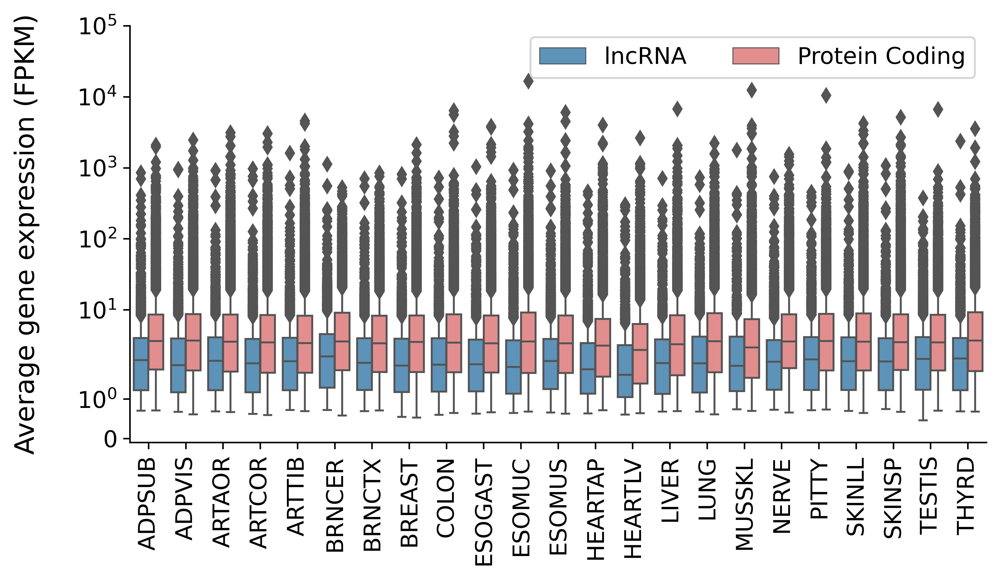

In [71]:
#create boxplot for distribuition of FPKM of genes for each tissue
fig, ax = plt.subplots(figsize = (8, 4), dpi = 600)

sns.boxplot(data = lncRNAexp, x = 'Tissues', y = 'Average FPKM',
            hue = 'geneType', palette = {'Protein Coding': '#F08080', 'lncRNA': '#4F96C8'}, linewidth = 1)

plt.legend(fontsize = 12, loc = 'upper right', ncol = 2)

plt.ylabel('''Average gene expression (FPKM)
''', fontsize = 14)
plt.xlabel('')
plt.xticks(rotation = 90, fontsize = 12, ha = 'center')
plt.yticks(rotation = 0, fontsize = 12, ha = 'right')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.yscale('symlog')
plt.ylim([-0.1, 100000])

plt.savefig(results_dir + 'plots/protein-lncrna.pdf')

In [72]:
#creates dataframe that says whether or not explncRNAexpsion groups in a given tissue are significantly different
lncRNAFDR = pd.DataFrame([])

for tissue in TissuesDict:
    expgroup1 = lncRNAexp[(lncRNAexp['Tissues'] == tissue) & (lncRNAexp['geneType'] == 'lncRNA')]['Average FPKM']
    expgroup2 = lncRNAexp[(lncRNAexp['Tissues'] == tissue) & (lncRNAexp['geneType'] == 'Protein Coding')]['Average FPKM']

    stats, pval = MWU(expgroup1, expgroup2) 
    additional = pd.DataFrame([[tissue, stats, pval]], columns = ['Tissue', 'Stat', 'p-value'])
    
    lncRNAFDR = pd.concat([lncRNAFDR, additional])

lncRNAFDR = FDR(lncRNAFDR)

In [73]:
lncRNAFDR[lncRNAFDR['FDR Significance'] == 'p > 0.05 (Not Significant)']

,Tissue,Stat,p-value,FDR,FDR Significance


.

.

.

# TRANSCRIPT LENGTH

In [74]:
#create dataframe with length of expressed TRT transcripts for each tissue
Lengthvalues = pd.DataFrame([])

for tissue in TissuesDict:
    Length = TissuesDict[tissue][3]['Length']
    tissuevalues = pd.DataFrame({tissue: Length})
    Lengthvalues = pd.concat([Lengthvalues, tissuevalues], axis = 1)

(-8000.0, 60000.0)

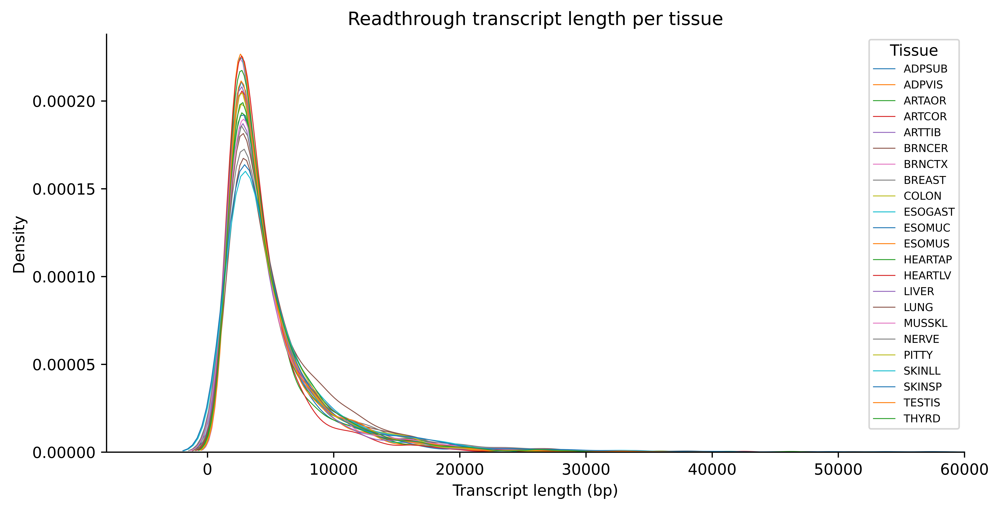

In [75]:
#create density plot for distribuition of length of TRT transcripts for each tissue
fig, ax = plt.subplots(figsize = (10, 5), dpi = 1000)

for tissue in Lengthvalues:
    sns.kdeplot(Lengthvalues[tissue].dropna(), ax = ax, linewidth = 0.6, linestyle = '-', label = tissue, palette =  PaletteDict)
    plt.legend(prop = {'size': 7}, title = 'Tissue')

ax.set_ylabel('Density', fontsize = 10)
ax.set_xlabel('Transcript length (bp)', fontsize = 10); 
ax.set_title('Readthrough transcript length per tissue', fontsize = 12)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.xlim([-8000,60000])

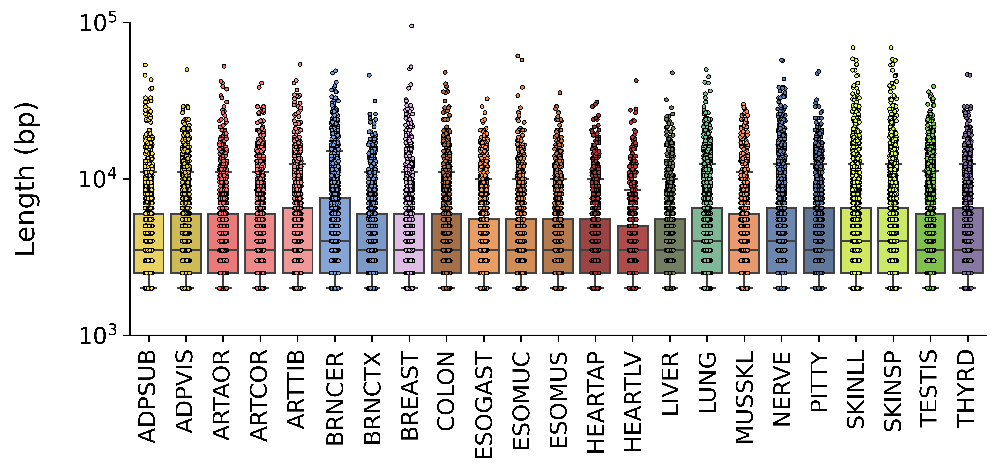

In [76]:
#create boxplot for distribuition of length of RT transcripts for each tissue
fig, ax = plt.subplots(figsize = (8, 3), dpi = 1000)

sns.boxplot(data = Lengthvalues, linewidth = 1, palette = PaletteDict, fliersize = 0)
sns.stripplot(data = Lengthvalues, size = 2, linewidth = 0.5, edgecolor = 'black', palette = PaletteDict)

plt.ylabel('''Length (bp)
''', fontsize = 14)
plt.xticks(rotation = 90, fontsize = 12, ha = 'center')
plt.yticks(rotation = 0, fontsize = 12, ha = 'right')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.ylim([1000, 100000])
plt.yscale('symlog')
plt.savefig(results_dir + 'plots/rtlength.pdf')

In [77]:
#min length for each tissue
Lengthvalues.min().sort_values()

ADPSUB     1999.0
SKINSP     1999.0
SKINLL     1999.0
PITTY      1999.0
NERVE      1999.0
MUSSKL     1999.0
LUNG       1999.0
LIVER      1999.0
HEARTLV    1999.0
HEARTAP    1999.0
TESTIS     1999.0
ESOMUS     1999.0
ESOGAST    1999.0
COLON      1999.0
BREAST     1999.0
BRNCTX     1999.0
BRNCER     1999.0
ARTTIB     1999.0
ARTCOR     1999.0
ARTAOR     1999.0
ADPVIS     1999.0
ESOMUC     1999.0
THYRD      1999.0
dtype: float64

In [78]:
#max length for each tissue
Lengthvalues.max().sort_values()

MUSSKL     29999.0
HEARTAP    30999.0
ESOGAST    32499.0
ESOMUS     35499.0
TESTIS     38999.0
ARTCOR     40999.0
HEARTLV    42499.0
BRNCTX     45999.0
THYRD      46499.0
LIVER      47626.0
COLON      47999.0
PITTY      48683.0
BRNCER     48999.0
LUNG       49999.0
ADPVIS     49999.0
ARTAOR     52499.0
ADPSUB     53499.0
ARTTIB     53999.0
NERVE      57499.0
ESOMUC     61113.0
SKINLL     68999.0
SKINSP     68999.0
BREAST     94999.0
dtype: float64

In [79]:
#average length for each tissue
Lengthvalues.mean().sort_values()

HEARTLV    4491.446352
ESOMUS     4700.104629
HEARTAP    4726.644125
ESOMUC     4774.091207
BRNCTX     4779.782818
ESOGAST    4779.786855
LIVER      4839.585925
ADPVIS     5040.848584
COLON      5061.334524
ARTCOR     5094.262573
TESTIS     5138.208306
PITTY      5173.179509
ARTAOR     5176.191304
THYRD      5213.853714
ADPSUB     5222.079502
BREAST     5257.685921
MUSSKL     5262.050142
ARTTIB     5343.660206
LUNG       5497.770583
NERVE      5698.512570
SKINSP     5761.271421
SKINLL     5933.731100
BRNCER     5977.550957
dtype: float64

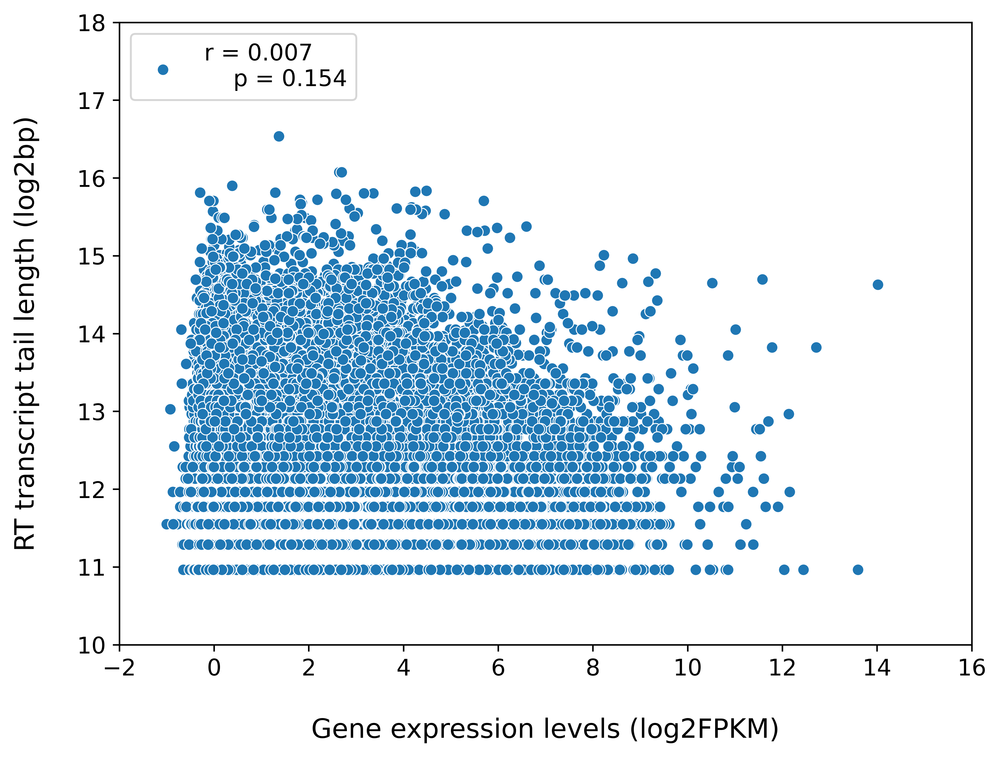

In [80]:
#correlation between gene expression and RT transcript tail length
xlabeltext = '''
Gene expression levels (log2FPKM)'''

ylabeltext = '''RT transcript tail length (log2bp)
'''

log2FPKMLength = np.log2(FPKMbyTRT[FPKMbyTRT['TRT'] == 'RT'][['Average FPKM','Length']])

CorrelationPlot(log2FPKMLength, 'Average FPKM', 'Length', xlabeltext, ylabeltext, (8, 6), [-2, 16], [10, 18], 'upper left')

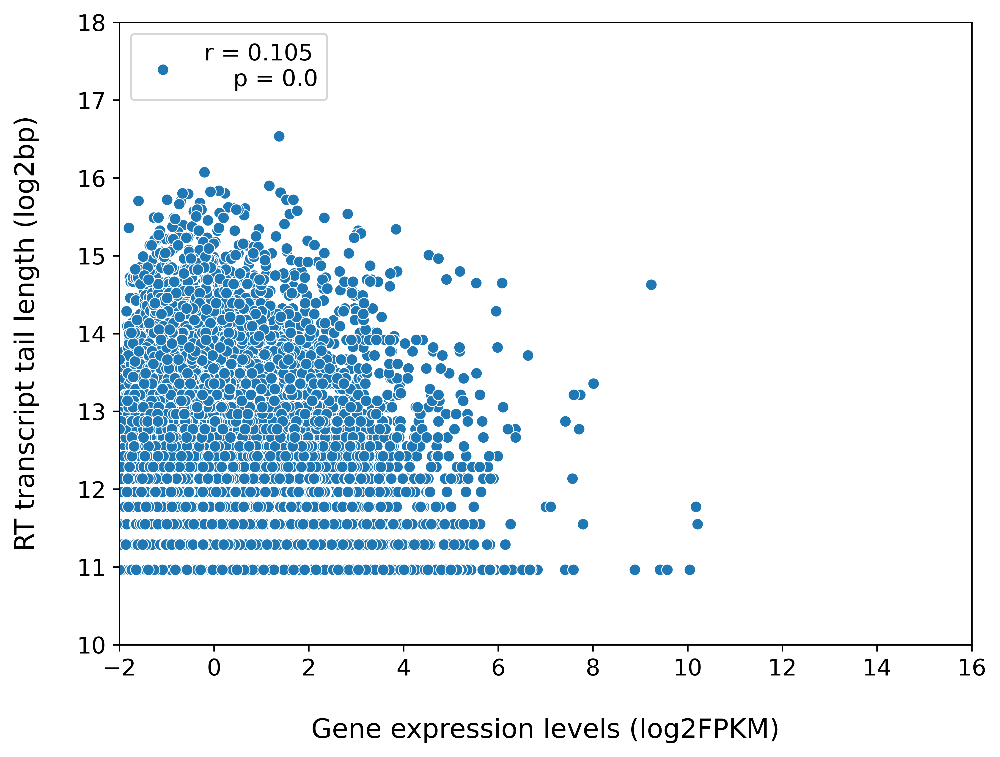

In [81]:
#correlation between RT transcript expression and RT transcript tail length
xlabeltext = '''
Gene expression levels (log2FPKM)'''

ylabeltext = '''RT transcript tail length (log2bp)
'''

log2FPKMLength = np.log2(FPKMbyTRT[FPKMbyTRT['TRT'] == 'RT'][['TRT FPKM','Length']])

CorrelationPlot(log2FPKMLength, 'TRT FPKM', 'Length', xlabeltext, ylabeltext, (8, 6), [-2, 16], [10, 18], 'upper left')

.

.

.

# DISTANCE FROM RT TRANSCRIPT TO CLOSEST DOWNSTREAM GENE

In [82]:
#create bed files with only expressed genes and TRT transcripts for each tissue and then save
for tissue in TissuesDict:
    tissue_folder = TissuesDict[tissue][0]
    TRT = TissuesDict[tissue][2]
    
    TRTbed = pd.read_table(artdeco_dir + folder + '/dogs-filtered-antisense-genes/all_dogs.bed',
                           names = ['Chromosome', 'Start', 'End', 'ID', 'Score', 'Strand'])
    TRTbed = TRTbed[TRTbed['ID'].isin(TRT['ID'])]
    
    
    #make start point of TRT transcript only 100 bp before end because we only want to know what happens there
    #and if we keep the whole transcript, we might get more than one overlap result
    plusTRT = TRTbed[TRTbed['Strand'] == '+'].copy()
    plusTRT['Start'] = plusTRT['End'] - 100
    #for strand -, 'Start' is actually end of the transcript, so to change start what we need to change is 'End'
    minusTRT = TRTbed[TRTbed['Strand'] == '-'].copy()
    minusTRT['End'] = minusTRT['Start'] + 100
    TRTbed = pd.concat([minusTRT, plusTRT])
    
    
    pathway = results_dir + 'bedfiles/' + tissue_folder
    if os.path.exists(pathway) is False:
        os.makedirs(pathway)
    else:
        pass

    TRTbed.to_csv(pathway + '/TRT100.bed', sep = '\t', index = False, header = False)

#use these commands to run bedtools:
#cd /mnt/c/Users/Admin/Documents/RESULTS/bedfiles/
#for i in *; do >$i/100sortedTRT.bed sort -k1,1V -k2,2n -i $i/TRT100.bed; done
#for i in *; do >$i/sortedGenes.bed sort -k1,1V -k2,2n -i $i/Genes.bed; done
#for i in *; do >$i/100closest.txt closestBed -D a -iu -a $i/100sortedTRT.bed -b $i/sortedGenes.bed; done

In [83]:
#create 3 daframes: one with all info, one with summarised strand info and one with average distances
Closest = pd.DataFrame([])
StrandSummary = pd.DataFrame([], columns = ['Occurrences', 'Strands', 'Gene Strand', 'Strand', 'Tissue'])
AverageDistances = pd.DataFrame([], columns = ['Distance', 'Tissue'])

for tissue in TissuesDict:
    folder = TissuesDict[tissue][0]
    
    #upload file resulting from bedtools closest
    tissueclosest = pd.read_table(results_dir + 'bedfiles/' + folder + '/100closest.txt',
                                  names = ['Chromosome', 'Start TRT', 'End TRT', 'ID TRT',
                                           'Score TRT', 'Strand TRT', 'Chromosome Gene', 'Start Gene', 'End Gene',
                                           'ID Gene', 'Score Gene', 'Strand Gene', 'Distance'])
     
    #delete results where there isn't a closest gene
    tissueclosest = tissueclosest[~tissueclosest.isin(tissueclosest[tissueclosest['Distance'] == -1])]
    
    #add column with tissue
    tissueclosest = pd.concat([tissueclosest, pd.DataFrame([[tissue]*len(tissueclosest['Chromosome'])],
                                                           index = ['Tissue']).T], axis = 1)
    
    #save only IDs, chromosome, strands, distance and tissue
    mantain = ['Tissue', 'Chromosome', 'ID TRT', 'Strand TRT', 'ID Gene', 'Strand Gene', 'Distance'] 
    Closest = pd.concat([Closest, tissueclosest[mantain]])

    #create dataframe for barplot that shows summarised strand info (how often the strands are the same or opposite strands)
    bothplus = tissueclosest[(tissueclosest['Strand TRT'] == '+') & (tissueclosest['Strand Gene'] == '+')]
    bothminus = tissueclosest[(tissueclosest['Strand TRT'] == '-') & (tissueclosest['Strand Gene'] == '-')]
    diff1 = tissueclosest[((tissueclosest['Strand TRT'] == '-') & (tissueclosest['Strand Gene'] == '+'))]
    diff2 = tissueclosest[((tissueclosest['Strand TRT'] == '+') & (tissueclosest['Strand Gene'] == '-'))]
    additional = pd.DataFrame([[len(bothplus), 'Both +', '+', 'Same', tissue],
                               [len(bothminus), 'Both -', '-', 'Same', tissue],
                               [len(diff1), 'Opposite', '+', 'Opposite', tissue],
                               [len(diff2), 'Opposite', '-', 'Opposite', tissue]],
                              columns = ['Occurrences', 'Strands', 'Gene Strand', 'Strand', 'Tissue'])
    StrandSummary = pd.concat([StrandSummary, additional])
    
    #create dataframe with average distances
    additional = pd.DataFrame([round(tissueclosest['Distance'].mean()), tissue], index = ['Distance', 'Tissue']).T
    AverageDistances = pd.concat([AverageDistances, additional])
    
Closest = Closest.dropna()
Closest.to_csv(results_dir + 'bedfiles/Closest100.txt', sep = '\t', index = False, header = False)
Closest = Closest.reset_index(drop = True)

In [84]:
#add column that says whether or not RT transcript and closest gene are on the same strand
Same = Closest[Closest['Strand TRT'] == Closest['Strand Gene']].copy()
Same = Same.reset_index(drop = True)
SameColumn = pd.DataFrame([['Same']*len(Same)]).T
Same['Strand'] = SameColumn

Diff = Closest[~(Closest['Strand TRT'] == Closest['Strand Gene'])].copy()
Diff = Diff.reset_index(drop = True)
DiffColumn = pd.DataFrame([['Opposite']*len(Diff)]).T
Diff['Strand'] = DiffColumn

Closest = pd.concat([Same, Diff])
Closest = Closest.reset_index(drop = True)

In [85]:
#add column with TRT transcript tail length
LengthColumn = pd.DataFrame()
ClosestGenes = pd.DataFrame([], columns = ['Tissue', 'Chromosome', 'ID TRT', 'Strand TRT', 'ID Gene', 'Strand Gene', 'Distance', 'Strand'])
for tissue in TissuesDict:
    Length = TissuesDict[tissue][3]
    tissueClosest = Closest[Closest['Tissue'] == tissue].copy()
    #ClosestGenes = pd.concat([ClosestGenes, tissueClosest])
    for line in tissueClosest.index:
        ID = Closest.iloc[line]['ID TRT']
        val = int(Length[Length['ID'] == ID]['Length'])
        additional = pd.concat([pd.DataFrame([tissue], columns = ['Tissue']), pd.DataFrame([ID], columns = ['ID']), pd.DataFrame([val], columns = ['Length'])], axis = 1)
        LengthColumn = pd.concat([LengthColumn, additional])
LengthColumn = LengthColumn.reset_index(drop = True)
Closest = Closest.reset_index(drop = True)
Closest['Length'] = LengthColumn['Length']

In [86]:
#add column with distance + length
ScatterplotDistance = pd.DataFrame([Closest['Distance'] + Closest['Length']], index = ['Distance + Length']).T
Closest = pd.concat([Closest, ScatterplotDistance], axis = 1)

In [87]:
#save dataframes
Closest.to_csv(results_dir + 'bedfiles/Closest.txt', sep = '\t', index = False)
StrandSummary.to_csv(results_dir + 'bedfiles/StrandSummary.txt', sep = '\t', index = False)
AverageDistances.to_csv(results_dir + 'bedfiles/AverageDistances.txt', sep = '\t', index = False)

In [88]:
def Give2ScatterPlotsSpearman(dataframe1, xcolumn1, ycolumn1, labelcondition1, dataframe2, xcolumn2, ycolumn2, labelcondition2, title):
    """GIVES 2 SCATTER PLOTS FOR CORRELATION IN THE SAME FIGURE"""
    
    fig, ax = plt.subplots(figsize = (6, 6), dpi = 1000)
    
    plt.title(title, fontsize = 20)
    
    spearmantext1 = '''
    ''' + labelcondition1 + 'r = ' + str(sp.stats.spearmanr(dataframe1[xcolumn1], dataframe1[ycolumn1])[0]) + '''
    p = ''' + str(sp.stats.spearmanr(dataframe1[xcolumn1], dataframe1[ycolumn1])[1])
    
    spearmantext2 = '''
    ''' + labelcondition2 + 'r = ' + str(sp.stats.spearmanr(dataframe2[xcolumn2], dataframe2[ycolumn2])[0]) + '''
    p = ''' + str(sp.stats.spearmanr(dataframe2[xcolumn2], dataframe2[ycolumn2])[1])
    
    sns.scatterplot(x = dataframe1[xcolumn1], y = dataframe1[ycolumn1], label = spearmantext1)
    
    sns.scatterplot(x = dataframe2[xcolumn2], y = dataframe2[ycolumn2], label = spearmantext2)
    
    plt.xticks(fontsize = 14, ha = 'center')
    
    #plt.yscale('symlog')
    
    plt.ylabel('Distance + Length (bp)', fontsize = 16)
    
    return plt.show()

In [89]:
def Give2CorrelationPlots(dataframe1, xcolumn1, ycolumn1, labelcondition1, dataframe2, xcolumn2, ycolumn2, labelcondition2, xlabeltext, ylabeltext, fig, xlims, ylims, legendloc = 'upper right', save = 'no'):
    #GIVES SCATTER PLOT FOR CORRELATION
    
    legendtext1 = '''
    ''' + labelcondition1 + 'r = ' + str(round(sp.stats.pearsonr(dataframe1[xcolumn1], dataframe1[ycolumn1])[0], 3)) + '''
    p = ''' + str(round(sp.stats.pearsonr(dataframe1[xcolumn1], dataframe1[ycolumn1])[1], 3))
    
    legendtext2 = '''
    ''' + labelcondition2 + 'r = ' + str(round(sp.stats.pearsonr(dataframe2[xcolumn2], dataframe2[ycolumn2])[0], 3)) + '''
    p = ''' + str(round(sp.stats.pearsonr(dataframe2[xcolumn2], dataframe2[ycolumn2])[1], 3))
    
    plt.subplots(figsize = fig, dpi = 600)
    
    sns.scatterplot(x = dataframe1[xcolumn1], y = dataframe1[ycolumn1], label = legendtext1)
    sns.scatterplot(x = dataframe2[xcolumn2], y = dataframe2[ycolumn2], label = legendtext2)
    plt.legend(fontsize = 16)
    
    plt.xlabel(xlabeltext, fontsize = 14)
    plt.ylabel(ylabeltext, fontsize = 14)
    
    plt.xticks(rotation = 0, fontsize = 12, ha = 'center')
    plt.yticks(rotation = 0, fontsize = 12, ha = 'right')
    
    plt.legend(fontsize = 12, loc = legendloc)
    
    plt.xlim(xlims)
    plt.ylim(ylims)
    
    if save is not 'no':
        plt.savefig(results_dir + save)
    else:
        pass
    
    return plt.show()

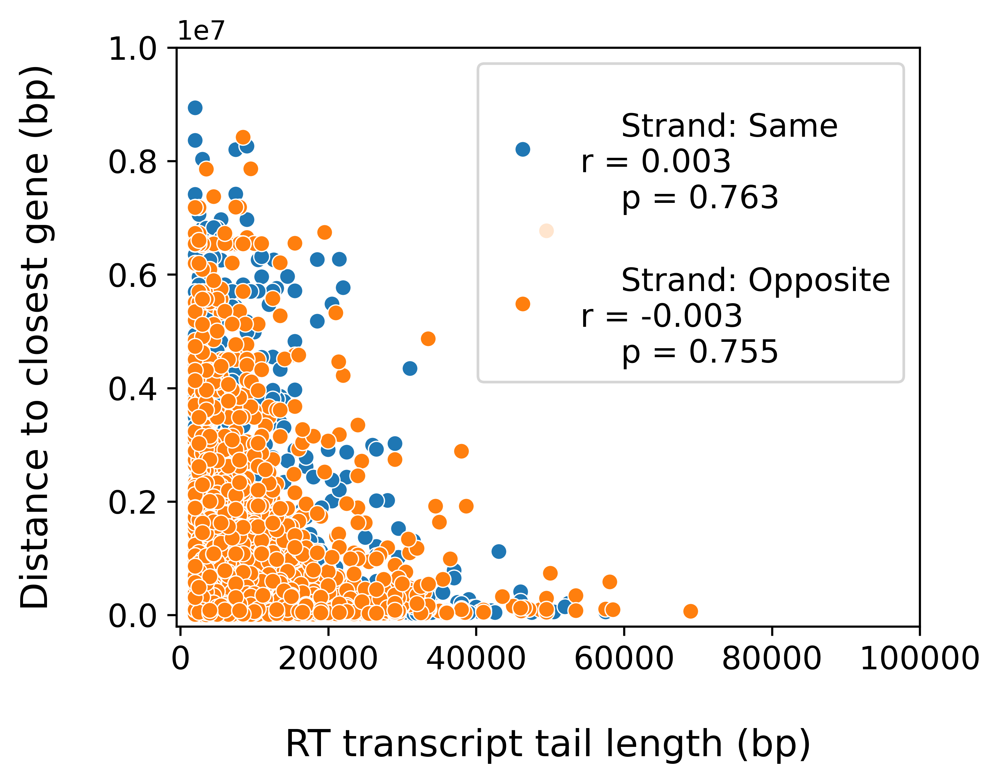

In [90]:
#correlation between RT transcript length and distance to closest gene
Give2CorrelationPlots(Closest[(Closest['Strand'] == 'Same')], 'Length', 'Distance + Length', '''Strand: Same
''', Closest[(Closest['Strand'] == 'Opposite')], 'Length', 'Distance + Length', '''Strand: Opposite
''', '''
RT transcript tail length (bp)''', '''Distance to closest gene (bp)
''', (5,4), [-500,100000], [-200000,10000000])

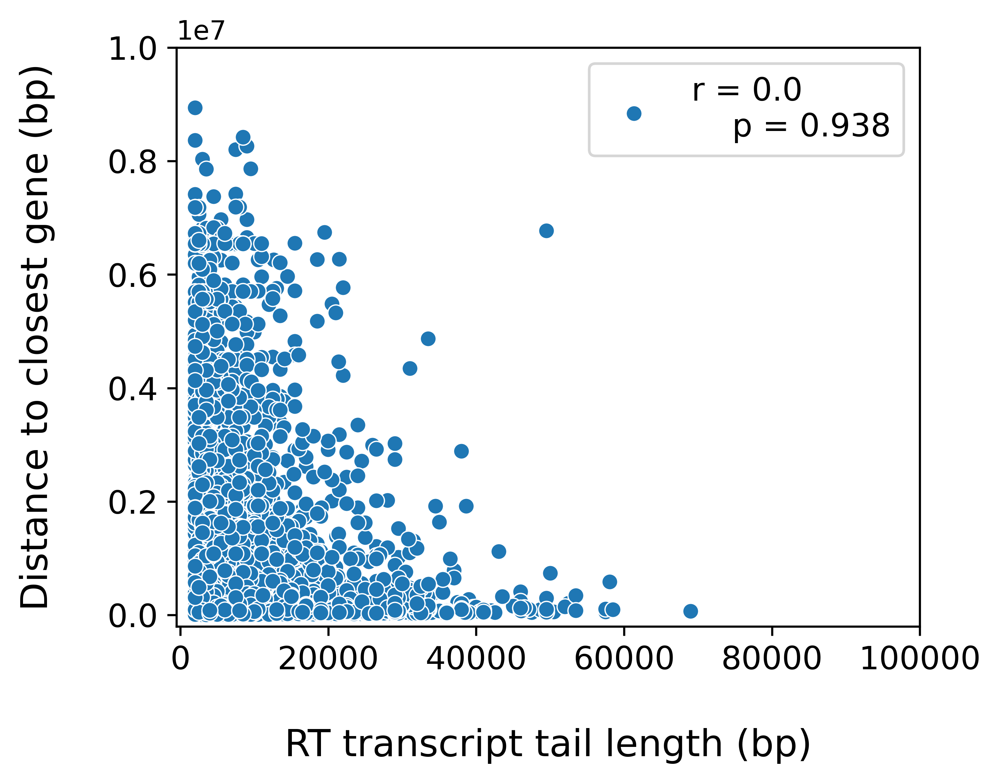

In [91]:
#correlation between tail length and distance to closest gene
xlabeltext = '''
RT transcript tail length (bp)'''

ylabeltext = '''Distance to closest gene (bp)
'''

CorrelationPlot(Closest, 'Length', 'Distance + Length', xlabeltext, ylabeltext, (5,4), [-500,100000], [-200000,10000000])

In [92]:
sp.stats.pearsonr(Closest['Length'], Closest['Distance + Length'])

(0.0004885297857423463, 0.9383396980769267)

In [93]:
def histcountsdf(df, histlist):
    """GIVES NUMBER OF GENES IN EACH COHORT"""
    newdf = pd.DataFrame.sort_values(df, 'Distance', ascending = True).reset_index(drop = True)
    histcolumn = pd.DataFrame()
    

    for distance in newdf['Distance']:
        for h in range(len(histlist)):
            if h+1 in range(len(histlist)):
                if distance > histlist[h] and distance <= histlist[h+1]:
                    histcolumn = pd.concat([histcolumn, pd.DataFrame([histlist[h+1]])])
            else:
                pass
    
    histcolumn = histcolumn.reset_index(drop = True)
    newdf['Hist'] = histcolumn
    newdf['Distances'] = histcolumn
    
    counts = newdf.groupby(['Distances']).count()
    
    res1 = pd.DataFrame(counts.index).reset_index(drop = True)
    res2 = counts['Hist'].reset_index(drop = True)
    
    res = pd.concat([res1, res2], axis = 1)
    
    return res

In [94]:
#create dataframe with number of transcripts in each cohort
histlist = [-1, 500, 5000, 10000, 15000, 20000, 30000, 40000, 50000, 60000,
            70000, 80000, 90000, 100000, 125000, 150000, 200000, 250000, 300000,
            400000, 500000, 750000, 1000000, 1500000, 2000000, 2500000, 25000000]
histsame = histcountsdf(Closest[(Closest['Strand'] == 'Same')], histlist)
histdiff = histcountsdf(Closest[(Closest['Strand'] == 'Opposite')], histlist)
#histdiff['Distances'] = -histdiff['Distances']
histsame['Strand'] = pd.DataFrame([len(histdiff)*['Same']]).T
histdiff['Strand'] = pd.DataFrame([len(histdiff)*['Opposite']]).T
histall = pd.concat([histsame, histdiff])

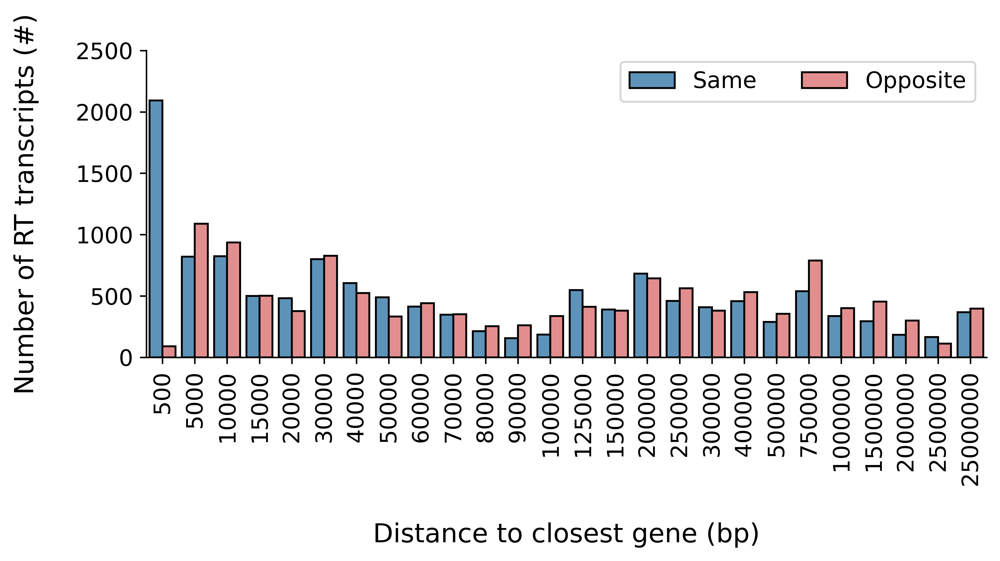

In [95]:
#barplot showing distance between RT transcript and closest gene
fig, ax = plt.subplots(figsize = (8, 3), dpi = 600)

sns.barplot(data = histall, x = 'Distances', y = 'Hist', hue = 'Strand',
            palette = {'Same': '#4F96C8', 'Opposite': '#F08080'}, edgecolor = 'black', linewidth = 1)

plt.legend(fontsize = 12, ncol = 2)

plt.ylabel('''Number of RT transcripts (#)
''', fontsize = 14)
plt.xlabel('''
Distance to closest gene (bp)''', fontsize = 14)
plt.xticks(rotation = 90, fontsize = 12, ha = 'center')
plt.yticks(rotation = 0, fontsize = 12, ha = 'right')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.ylim([0, 2500])

plt.savefig(results_dir + 'plots/trtclosest.pdf')

In [96]:
#calculates whether or not distribution is similar
expgroup1 = histall[histall['Strand'] == 'Same']['Hist']
expgroup2 = histall[histall['Strand'] == 'Opposite']['Hist']

stats, pval = MWU(expgroup1, expgroup2) 
HistMWU = pd.DataFrame([[stats, pval]], columns = ['Stat', 'p-value'])
HistMWU

,Stat,p-value
0,344.5,0.91256


.

.

.

# DISTANCE FROM GENE TO CLOSEST DOWNSTREAM GENE

In [97]:
#BEDCLOSEST FOR GENES
#for i in *; do >$i/GenesClosest.txt closestBed -D a -iu -io -a $i/sortedGenes.bed -b $i/sortedGenes.bed; done
ClosestGenes = pd.DataFrame([])


for tissue in TissuesDict:
    folder = TissuesDict[tissue][0]
    
    #upload file resulting from bedtools closest
    tissueclosestgenes = pd.read_table(results_dir + 'bedfiles/' + folder + '/GenesClosest.txt',
                                  names = ['Chromosome', 'Start Gene', 'End Gene', 'ID Gene', 'Score Gene',
                                           'Strand Gene', 'Chromosome Closest Gene', 'Start Closest Gene',
                                           'End Closest Gene', 'ID Closest Gene', 'Score Closest Gene',
                                           'Strand Closest Gene', 'Distance'])
     
    #delete results where there isn't a closest gene
    tissueclosestgenes = tissueclosestgenes[~tissueclosestgenes.isin(tissueclosestgenes[tissueclosestgenes['Distance'] == -1])]
    
    #add column with tissue
    tissueclosestgenes = pd.concat([tissueclosestgenes, pd.DataFrame([[tissue]*len(tissueclosestgenes['Chromosome'])],
                                                           index = ['Tissue']).T], axis = 1)
    
    #save only IDs, chromosome, strands, distance and tissue
    mantain = ['Tissue', 'Chromosome', 'ID Gene', 'Strand Gene', 'ID Closest Gene', 'Strand Closest Gene', 'Distance'] 
    ClosestGenes = pd.concat([ClosestGenes, tissueclosestgenes[mantain]])
    
ClosestGenes = ClosestGenes.dropna()
ClosestGenes.to_csv(results_dir + 'bedfiles/ClosestGenes.txt', sep = '\t', index = False, header = False)
ClosestGenes = ClosestGenes.reset_index(drop = True)

In [98]:
#add column that says whether or not gene produces RT transcript
ClosestGenesWithTRT = pd.DataFrame()

for tissue in TissuesDict:
    TRT = TissuesDict[tissue][2]
    tissueclosestgenes = ClosestGenes[(ClosestGenes['Tissue'] == tissue)].copy()  

    HasTRT = tissueclosestgenes[tissueclosestgenes['ID Gene'].isin(TRT['ID'])].copy()
    HasTRT = HasTRT.reset_index(drop = True)
    HasTRTColumn = pd.DataFrame([['RT']*len(HasTRT)]).T
    HasTRT['TRT'] = HasTRTColumn

    NoTRT = tissueclosestgenes[~tissueclosestgenes['ID Gene'].isin(TRT['ID'])].copy()
    NoTRT = NoTRT.reset_index(drop = True)
    NoTRTColumn = pd.DataFrame([['NRT']*len(NoTRT)]).T
    NoTRT['TRT'] = NoTRTColumn

    additional = pd.concat([HasTRT, NoTRT])
    additional = additional.reset_index(drop = True)
    ClosestGenesWithTRT = pd.concat([ClosestGenesWithTRT, additional])
    ClosestGenesWithTRT = ClosestGenesWithTRT.reset_index(drop = True)

In [99]:
#add column that says whether or not gene and ClosestGenesWithTRT gene are on the same strand
Same = ClosestGenesWithTRT[ClosestGenesWithTRT['Strand Gene'] == ClosestGenesWithTRT['Strand Closest Gene']].copy()
Same = Same.reset_index(drop = True)
SameColumn = pd.DataFrame([['Same']*len(Same)]).T
Same['Strand'] = SameColumn

Diff = ClosestGenesWithTRT[~(ClosestGenesWithTRT['Strand Gene'] == ClosestGenesWithTRT['Strand Closest Gene'])].copy()
Diff = Diff.reset_index(drop = True)
DiffColumn = pd.DataFrame([['Opposite']*len(Diff)]).T
Diff['Strand'] = DiffColumn

ClosestGenesWithTRT = pd.concat([Same, Diff])
ClosestGenesWithTRT = ClosestGenesWithTRT.reset_index(drop = True)

In [100]:
histgeneslist = [-1, 500, 5000, 10000, 15000, 20000, 30000, 40000, 50000, 60000,
            70000, 80000, 90000, 100000, 125000, 150000, 200000, 250000, 300000,
            400000, 500000, 750000, 1000000, 1500000, 2000000, 2500000, 25000000]
histgenessame = histcountsdf(ClosestGenesWithTRT[(ClosestGenesWithTRT['Strand'] == 'Same')], histgeneslist)
histgenesdiff = histcountsdf(ClosestGenesWithTRT[(ClosestGenesWithTRT['Strand'] == 'Opposite')], histgeneslist)
histgenessame['Strand'] = pd.DataFrame([len(histgenesdiff)*['Same']]).T
histgenesdiff['Strand'] = pd.DataFrame([len(histgenesdiff)*['Opposite']]).T
histgenesall = pd.concat([histgenessame, histgenesdiff])

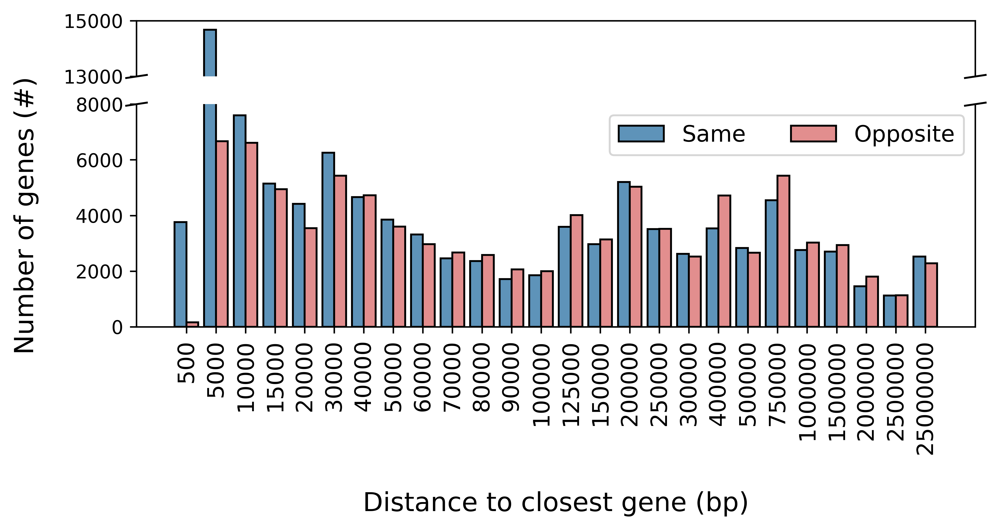

In [101]:
#create plot for distances between genes
fig, (ax2, ax1) = plt.subplots(2, 1, sharex = True, figsize = (8,3), dpi = 600)

#adjust subplot sizes
gs = GridSpec(2, 1, height_ratios = [1, 4])
ax2.set_position(gs[0].get_position(fig))
ax1.set_position(gs[1].get_position(fig))

#plot ax1 (lower)
sns.barplot(data = histgenesall.convert_dtypes(), x = 'Distances', y = 'Hist', hue = 'Strand',
            palette = {'Same': '#4F96C8', 'Opposite': '#F08080'}, edgecolor = 'black', linewidth = 1, ax = ax1)
ax1.legend([],[], frameon = False)
ax1.set_ylim([0, 8000])

#plot ax2 (higher)
sns.barplot(data = histgenesall.convert_dtypes(), x = 'Distances', y = 'Hist', hue = 'Strand',
            palette = {'Same': '#4F96C8', 'Opposite': '#F08080'}, edgecolor = 'black', linewidth = 1, ax = ax2)
ax2.legend([],[], frameon = False)
plt.legend(fontsize = 12, ncol = 2)
ax2.set_ylim([13000, 15000])

#delete middle lines from each ax
ax2.spines['bottom'].set_visible(False)
ax1.spines['top'].set_visible(False)

#delete labels
ax1.set_ylabel('')
ax2.set_ylabel('')
ax1.set_xlabel('')
ax2.set_xlabel('')


plt.xlabel('''
Distance to closest gene (bp)''', fontsize = 14)
plt.ylabel('''Number of genes (#)
''', fontsize = 14)

#remove xticks from ax2
ax2.tick_params(axis = 'x', which = 'both', bottom = False, top = False, labelbottom = False)

#draw slanted line
d = 0.15 #proportion of vertical to horizontal extent of the slanted line
kwargs = dict(marker = [(-1, -d), (1, d)], markersize = 12,
              linestyle = 'none', color = 'k', mec = 'k', mew = 1, clip_on = False)
ax1.plot([0, 1], [1, 1], transform = ax1.transAxes, **kwargs)
ax2.plot([0, 1], [0, 0], transform = ax2.transAxes, **kwargs)

#change xtick labels
plt.xticks(rotation = 90, fontsize = 12, ha = 'center')

#change yticks
ax1.set_yticks(np.asarray([0, 2000, 4000, 6000, 8000]))
ax2.set_yticks(np.asarray([13000, 15000]))


plt.savefig(results_dir + 'plots/genesclosest.pdf')

In [102]:
histgenesall = histgenesall.reset_index(drop = True)

In [103]:
#calculates whether or not distribution is similar
expgroup1 = histgenesall[histgenesall['Strand'] == 'Same']['Hist']
expgroup2 = histgenesall[histgenesall['Strand'] == 'Opposite']['Hist']

stats, pval = MWU(expgroup1, expgroup2) 
HistgenesMWU = pd.DataFrame([[stats, pval]], columns = ['Stat', 'p-value'])
HistgenesMWU

,Stat,p-value
0,343.0,0.934364


In [104]:
#calculates whether or not distribution is similar
expgroup1 = histgenesall['Hist']
expgroup2 = histall['Hist']

stats, pval = MWU(expgroup1, expgroup2) 
HistgenesMWU = pd.DataFrame([[stats, pval]], columns = ['Stat', 'p-value'])
HistgenesMWU

,Stat,p-value
0,2647.0,3.901944e-17


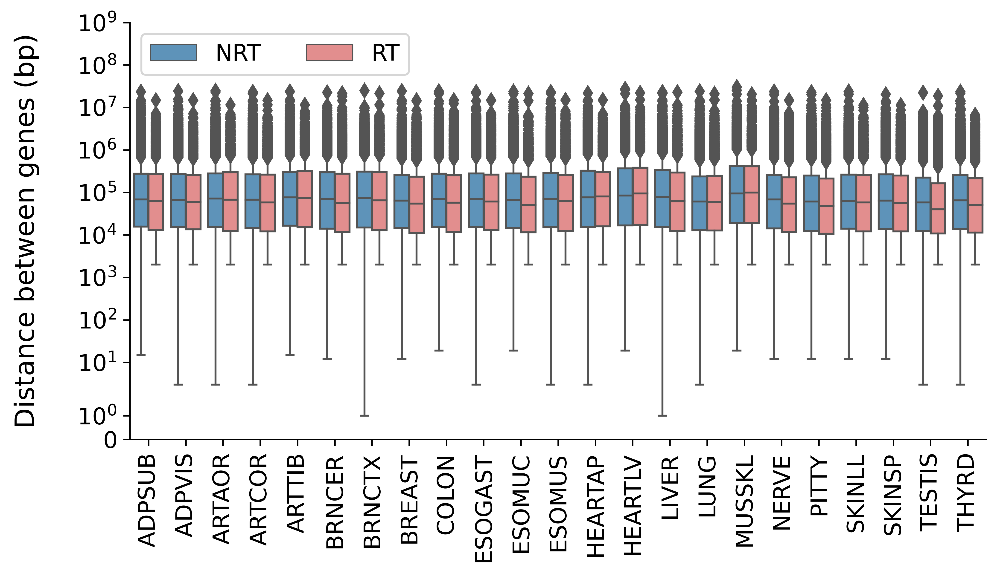

In [105]:
#create boxplot for distance between genes for each tissue
fig, ax = plt.subplots(figsize = (8, 4), dpi = 600)

sns.boxplot(data = ClosestGenesWithTRT, x = 'Tissue', y = 'Distance',
            hue = 'TRT', hue_order = ['NRT', 'RT'], palette = {'RT': '#F08080', 'NRT': '#4F96C8'}, linewidth = 1)

plt.legend(fontsize = 12, ncol = 2, loc = 'upper left')

plt.ylabel('''Distance between genes (bp)
''', fontsize = 14)
plt.xlabel('')
plt.xticks(rotation = 90, fontsize = 12, ha = 'center')
plt.yticks(rotation = 0, fontsize = 12, ha = 'right')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.ylim([0, 1000000000])

plt.yscale('symlog')

plt.savefig(results_dir + 'plots/distancesclosestgenes.pdf')

In [106]:
#creates dataframe that says whether or not differences in distance between genes are significantly different
DistanceMWU = pd.DataFrame([])

for tissue in TissuesDict:
    expgroup1 = ClosestGenesWithTRT[(ClosestGenesWithTRT['Tissue'] == tissue) & (ClosestGenesWithTRT['TRT'] == 'RT')]['Distance']
    expgroup2 = ClosestGenesWithTRT[(ClosestGenesWithTRT['Tissue'] == tissue) & (ClosestGenesWithTRT['TRT'] == 'NRT')]['Distance']

    additional = pd.DataFrame([[tissue, MWU(expgroup1, expgroup2)[1]]], columns = ['Tissue', 'p-value'])

    DistanceMWU = pd.concat([DistanceMWU, additional])

DistanceMWU = FDR(DistanceMWU)

In [107]:
DistanceMWU[DistanceMWU['FDR Significance'] == 'p < 0.05 (Significant)']

,Tissue,p-value,FDR,FDR Significance
0,TESTIS,0.000011,0.000251,p < 0.05 (Significant)
